
### Com os embeddings criados, o próximo desafio é mapear e identificar onde, dentro dessas representações, cada pilar-chave está localizado — como cor, estampa e modelagem.

A ideia é analisar como essas características se manifestam no espaço vetorial dos embeddings. Precisamos descobrir em quais subespaços específicos cada atributo se concentra, de forma que, por exemplo, cores semelhantes tenham vetores próximos dentro do subespaço dedicado à cor. Esse mapeamento permitirá uma separação clara entre os diferentes pilares e facilitará a análise de similaridade e comparação de produtos com base em atributos específicos.

# PILAR DE COR

Vamos começar com foco em identificar o subespaço de cor das roupas.

### Ideias

**Ideia 1: Inclusão de Blocos de Cores Sólidas e PCA**\
Uma abordagem inicial consiste em gerar embeddings a partir de blocos de cores sólidas e descrições genéricas centradas na cor (por exemplo, "roupa de cor amarela"), em conjunto com os embeddings dos produtos. A hipótese é que, ao incluir essas informações no conjunto de dados, poderemos identificar o subespaço relacionado às cores por meio da Análise de Componentes Principais (PCA), verificando se existe um agrupamento claro que capture a variação cromática.

Possíveis testes:

- Gerar embeddings de imagens com cores puras.
- Gerar embeddings de descrições de cores.
- Gerar embeddings com imagens de uma mesma roupa de diferentes cores.

*Comentário: Esta abordagem é interessante pois explora a capacidade do modelo de associar variações puras de cor, aproveitando
a PCA para redução de dimensionalidade e exploração da variância nas dimensões cromáticas.
O desafio será garantir que a cor seja capturada de forma independente de outras características visuais,
como textura ou estampa.*


<!-- **Ideia 2: Utilização de PLS-DA com a Cor como Variável Alvo**\
Uma alternativa é utilizar Partial Least Squares (PLS), especificamente o PLS-DA (uma extensão do PLS tradicional adaptada para problemas de classificação, onde a variável dependente é categórica). Nessa abordagem, o objetivo é definir a cor como variável alvo e ajustar os embeddings de modo que as direções no espaço vetorial maximizem a correlação com os valores de cor.

*Comentário: É necessário ter uma variável alvo de cor para cada produto.* -->


**Ideia 2: Utilização LDA como redutor com a Cor como Variável Alvo**\
Outra alternativa é utilizar o LDA (Linear Discriminant Analysis) como redutor de dimensionalidade, com a cor como variável alvo. O LDA é um método de redução de dimensionalidade que visa maximizar a separação entre classes, o que pode ser útil para identificar o subespaço de cor.

*Como queremos que as cores estejam o mais separadas possível, o LDA pode ser uma boa opção para identificar o subespaço de cor.*

**Alternativa: retreinar o modelo inserindo imagens estratégicas**\
Caso os resultados não sejam positivos, há ainda a possibilidade de fazer um fine-tunnig no CLIP incluindo imagens que ajudem a identificar clusters posteriormente, como cores sólidas.


### Possíveis impasses
Precisamos garantir que o subespaço de cor não esteja considerando a cor do fundo e da modelo.

Qual abordagem é mais promissora inicialmente?

1. Primeiro nos preocupamos em testar diferentes técnicas para verificar se o modelo é capaz de identificar a cor independentemente disso.
2. Garantimos inicialmente que estamos olhando apenas para a roupa (excluir modelo e fundo) para só aí tentar identificar o subespaço da cor.(Possível impasse: será que isso piora a capacidade do modelo de reconhecer as roupas já que não tem a modelo como perspectiva e os recortes podem ficar não suaves?)

Uma possível solução seguindo a 2° abordagem seria recortar apenas a roupa e excluir modelo e fundo.

Encontrei uma maneira razoável de fazer isso em <https://colab.research.google.com/drive/1N-Uiq5OqJHxUsVFUcSmbOq0Om9VkK4bH#scrollTo=zeAIoYydgkVk>

Entretanto, apenas com alguns testes já foi possível notar que o modelo pode se perder por conta do recorte. Como o recorte não é suave, acaba interfirindo na cor principal da roupa. Talvez um caminho mais correto seria identificar nos embeddings o subespaço que corresponde a modelo e ao fundo.


*Vamos seguir explorando técnicas com as imagens inteiras e tentar identificar as cores das roupas independentemente.*

**Atualização**: 
    - Foi implementado uma técnica para recortar as imagens em um bounding box que contém a roupa de interesse.

In [1]:
# Bibliotecas
from matplotlib import pyplot as plt
from PIL import Image
import pandas as pd
import numpy as np
import random
import requests
import torch
from sklearn.decomposition import PCA
import plotly.graph_objs as go
import os

# Funções de apoio
from utils.functions import *

In [2]:
# ################### PASSAR PRO .py

# # Dicionário de cores ajustado para cada valor de COR_PREDOMINANTE
# color_dict = {
#     'OFF WHITE': '#FFFFFF',       # Tom neutro claro
#     'PRETO': '#000000',           # Preto puro
#     'AZUL': '#1f77b4',            # Azul padrão
#     'MULTICOLORIDO': '#808080',    # Cinza (para representar múltiplas cores de forma neutra)
#     'VERDE': '#2ca02c',           # Verde padrão
#     'ROSA': '#ff69b4',            # Rosa vibrante
#     'BEGE': '#D2B48C',            # Bege suave
#     'AMARELO': '#ffdd57',         # Amarelo claro
#     'VERMELHO': '#d62728',        # Vermelho escuro
#     'LARANJA': '#ff7f0e',         # Laranja padrão
#     'LILÁS': '#dda0dd',           # Lilás suave
#     'ROXO': '#9467bd',            # Roxo médio
#     'BRANCO': '#FFFFFF',          # Branco puro
#     'MARROM': '#8B4513',          # Marrom escuro
#     'CINZA': '#808080',           # Cinza médio
#     'VINHO': '#800000',           # Vinho escuro
#     'DOURADO': '#FFD700',         # Dourado puro
#     'JEANS': '#000080'            # Azul marinho
# }


# # Função que gera PCA para os embeddings
# def apply_pca(embeddings, n_components=2, modelo_pca=None):
#     """
#     Função para gerar uma redução de dimensionalidade PCA para os embeddings.
    
#     Args:
#         embeddings (ndarray): Conjunto de embeddings.
#         n_components (int): Número de componentes principais.
    
#     Returns:
#         PCA: Objeto PCA treinado.
#         ndarray: Embeddings transformados.
#     """
#     if modelo_pca is not None:
#         print("Usando modelo PCA fornecido.")
#         return modelo_pca.transform(embeddings), modelo_pca
#     else:
#         # Inicializando e treinando o PCA
#         print("Treinando um novo modelo PCA.")
#         pca = PCA(n_components=n_components)
#         embeddings_pca = pca.fit_transform(embeddings)
#         return embeddings_pca, pca
    
# def normalize_embeddings(embeddings_set1, embeddings_set2):
#     """
#     Normaliza os valores de embeddings_set1 para coincidir com o intervalo de embeddings_set2.
    
#     Args:
#         embeddings_set1 (ndarray): Embeddings que serão normalizados.
#         embeddings_set2 (ndarray): Embeddings cujos intervalos serão usados como referência.
    
#     Returns:
#         ndarray: Embeddings_set1 normalizado.
#     """
#     embeddings_normalized = embeddings_set1.copy()
#     for i in range(embeddings_normalized.shape[1]):
#         min_value_set2 = embeddings_set2[:, i].min()
#         max_value_set2 = embeddings_set2[:, i].max()
#         min_value_set1 = embeddings_normalized[:, i].min()
#         max_value_set1 = embeddings_normalized[:, i].max()
        
#         embeddings_normalized[:, i] = (
#             (embeddings_normalized[:, i] - min_value_set1) /
#             (max_value_set1 - min_value_set1) *
#             (max_value_set2 - min_value_set2) + min_value_set2
#         )
#     return embeddings_normalized


# def find_top_similar(
#     embeddings_set1,  # Primeiro conjunto de embeddings (ex.: roupas ou cores)
#     embeddings_set2,  # Segundo conjunto de embeddings (ex.: roupas ou cores)
#     n_top: int = 3  # Número de correspondências similares a retornar
# ):
#     """
#     Função para encontrar os índices e distâncias dos `n_top` embeddings mais similares para cada entrada em embeddings_set1.
    
#     Args:
#         embeddings_set1 (ndarray): Conjunto 1 de embeddings (ex.: roupas ou cores).
#         embeddings_set2 (ndarray): Conjunto 2 de embeddings (ex.: roupas ou cores).
#         normalize (bool): Indica se é necessário normalizar os embeddings.
#         n_top (int): Número de top similares a serem retornados.
    
#     Returns:
#         list of tuples: Lista onde cada entrada é um tuple com:
#                         - Índices dos `n_top` mais similares no embeddings_set2.
#                         - Distâncias correspondentes dos `n_top` mais similares.
#     """
    
#     # Convertendo para tensores do PyTorch
#     embeddings_set1 = torch.tensor(embeddings_set1, dtype=torch.float32)
#     embeddings_set2 = torch.tensor(embeddings_set2, dtype=torch.float32)
    
#     # Calculando a distância euclidiana
#     euclidean_dist = torch.cdist(embeddings_set1, embeddings_set2, p=2)
    
#     # Encontrando os índices e distâncias mais similares
#     results = []
#     for distances in euclidean_dist:
#         if isinstance(distances, torch.Tensor):
#             distances = distances.cpu().numpy()
        
#         # Obter os `n_top` índices com menores distâncias
#         sorted_indices = distances.argsort()[:n_top]
#         sorted_distances = distances[sorted_indices]
#         results.append((sorted_indices.tolist(), sorted_distances.tolist()))
    
#     return results


### Puxando embeddings já gerados das imagens e descrições

In [3]:
# Importanto embeddings das imagens e textos
df_img_embs = pd.read_parquet('datasets/img_embeddings.parquet')
df_text_embs = pd.read_parquet('datasets/text_embeddings.parquet')

In [4]:
df_img_embs.sample(2)

,id_produto,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
106,25-34-1754-0005,0.105586,0.197816,-0.104037,0.296696,-0.211871,-0.044130,-0.126925,-0.004891,0.759166,...,-0.273855,0.084493,1.095472,-0.042567,-0.189225,-0.578457,0.126315,1.569783,-0.231586,-0.029032
638,07-20-5835-0003,0.055192,-0.117611,-0.069946,0.236427,-0.433657,0.554499,-0.509109,-0.985579,0.396648,...,0.126130,-0.331702,0.147121,0.325670,-0.074211,-0.046747,0.040803,1.164011,0.007610,0.229148


In [5]:
df_text_embs.sample(2)

,id_produto,emb_text_0,emb_text_1,emb_text_2,emb_text_3,emb_text_4,emb_text_5,emb_text_6,emb_text_7,emb_text_8,...,emb_text_502,emb_text_503,emb_text_504,emb_text_505,emb_text_506,emb_text_507,emb_text_508,emb_text_509,emb_text_510,emb_text_511
339,52-06-0643-0024,0.233120,0.219815,-0.388387,0.347002,-0.207042,-0.133770,0.162432,-1.163101,0.137849,...,0.167643,-0.033728,0.497910,-0.332959,0.091038,0.009826,-0.263907,-0.327955,0.038986,0.080592
605,07-20-7076-09805,0.036349,-0.026034,-0.129388,0.188653,0.093264,0.024812,-0.035381,-0.694682,-0.021260,...,-0.022499,0.250455,0.451074,-0.164112,0.189439,0.073886,0.137130,0.176281,0.014241,-0.084652


In [6]:
print("Shape df_img_embs: ", df_img_embs.shape)
print("Shape df_text_embs: ", df_text_embs.shape)

Shape df_img_embs:  (766, 513)
Shape df_text_embs:  (766, 513)


### Visualizando espaço original
Podemos utilizar UMAP para visualizar um espaço de alta dimensão para tentar identificar padrões de agrupamento.

In [7]:
# Importando base categorizada pelo gpt
df_base_categorizada = pd.read_parquet('datasets/base_animale_categorizada.parquet')

In [8]:
# Merge entre as base para incluir COR_PREDOMINANTE em df_img_embs e df_text_embs
df_img_embs = df_img_embs.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

df_text_embs = df_text_embs.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

In [9]:
df_img_embs['COR_PREDOMINANTE'].value_counts()

PRETO            195
BEGE             111
AZUL              96
BRANCO            87
VERDE             73
AMARELO           36
LARANJA           32
ROSA              30
VERMELHO          29
OFF_WHITE         29
MULTICOLORIDO     13
ROXO              11
JEANS              8
MARROM             7
LILÁS              4
CINZA              3
VINHO              1
DOURADO            1
Name: COR_PREDOMINANTE, dtype: int64

In [10]:
# Aplicando apply_umap para visualização dos embeddings de df_img_embs
from utils.functions import apply_umap

emb_cols_img = [col for col in df_img_embs.columns if 'emb_img_' in col]

df_img_umap, umap_img_model = apply_umap(df_img_embs, emb_cols_img, n_components=2)

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [11]:
# Puxando COR_PREDOMINANTE para colorir o scatter plot
df_img_umap = pd.merge(df_img_umap, df_img_embs[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

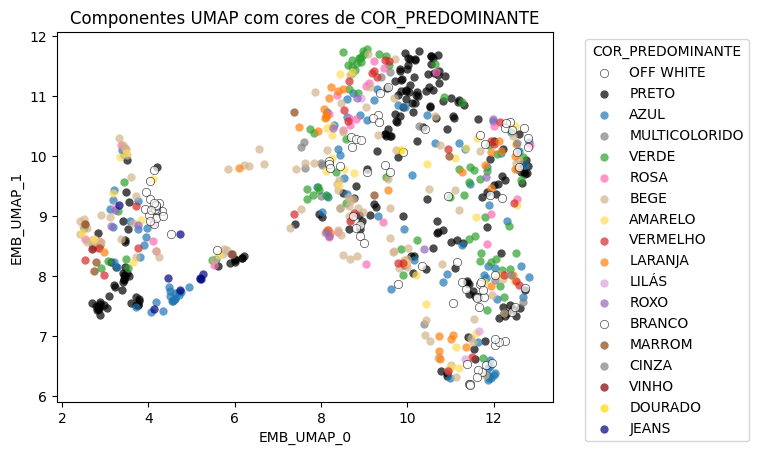

In [12]:
# Plot UMAP usando plot_cores
plot_cores(df_img_umap, cor_column='COR_PREDOMINANTE', reducer='UMAP', color_dict=color_dict)

Fica claro que no espaço original as cores estão misturadas e não seguem um padrão claro.

Importando modelo de embeddings

In [13]:
from sentence_transformers import SentenceTransformer, util

# We use the original clip-ViT-B-32 for encoding images
img_model = SentenceTransformer('clip-ViT-B-32')

# Our text embedding model is aligned to the img_model and maps 50+
# languages to the same vector space
text_model = SentenceTransformer('sentence-transformers/clip-ViT-B-32-multilingual-v1')

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: 'Could not find module 'C:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\image.pyd' (or one of its dependencies). Try using the full path with constructor syntax.'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\datapoints\__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorc

## 1° abordagem: PCA

### Descrições personalizadas

**Atualização**:
    - Alguns testes foram feitos e chegou-se na conclusão que as descrições em inglês são mais eficazes para o modelo.

In [14]:
description_list = [
    'Black color clothing',
    'White color clothing',
    'Red color clothing',
    'Yellow color clothing',
    'Green color clothing',
    'Blue color clothing',
    'Purple color clothing',
    'Brown color clothing',
    'Pink color clothing',
    'Orange color clothing'
]

cores_embeddings = text_model.encode(description_list)

In [15]:
df_img_embs.head(1)

,id_produto,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511,COR_PREDOMINANTE
0,03-04-0464-0030,0.159315,-0.024293,-0.117268,0.017468,-0.192906,0.137711,-0.402171,-0.144309,0.939456,...,-0.075428,0.560166,-0.266601,-0.213009,0.003456,0.25105,0.798051,-0.282096,0.032521,BEGE


In [16]:
# Pegando colunas no formato emb_img_
img_cols = [col for col in df_img_embs.columns if 'emb_img_' in col]
img_embs = df_img_embs[img_cols].values

Ponto importante: depois que reduzimos a dimensionalidade, não faz mais tanto sentido olharmos para a similaridade de cosseno, pois não estamos mais interessados em capturar direções parecidas e sim distâncias entre os pontos. Vamos substituir a similaridade de cosseno pela distância euclidiana.

#### 2 dimensões de PCA

In [17]:
# Treinando PCA para os embeddings de cores e aplicando a mesma transformação para os embeddings de imagens
cores_embeddings_pca, pca_cores_2d = apply_pca(cores_embeddings, n_components=2)

img_embeddings_pca, _ = apply_pca(img_embs, modelo_pca=pca_cores_2d)

Treinando um novo modelo PCA.
Usando modelo PCA fornecido.


PRIMEIRO NORMALIZAMOS O ESPAÇO OLHANDO PRA TODAS AS IMAGENS E DEPOIS FAZEMOS SAMPLE

In [18]:
img_embeddings_pca = normalize_embeddings(img_embeddings_pca, cores_embeddings_pca)

In [19]:
cores_embeddings_pca.shape

(10, 2)

##### Top 3 cores para cada imagem

Imagem: animale_images_cropped/vestido/vestido_vestido-ombro-a-ombro-listrado_est-listra-alquimia-print-e-kirli_07-20-6348-09612.jpg


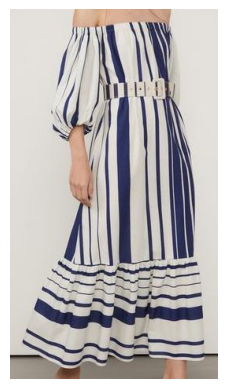

Similar: Blue color clothing - Distância: 0.87
Similar: Green color clothing - Distância: 1.00
Similar: Black color clothing - Distância: 1.07

Imagem: animale_images_cropped/saia/saia_saia-tricot-camadas_preto_25-11-1208-0005.jpg


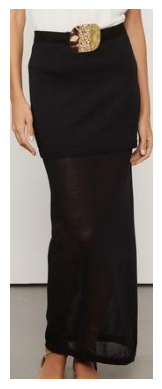

Similar: Blue color clothing - Distância: 0.96
Similar: Green color clothing - Distância: 1.07
Similar: Black color clothing - Distância: 1.20

Imagem: animale_images_cropped/vestido/vestido_vestido-de-couro-midi-assimetrico-com-drapeado_preto_07-20-5868-0005.jpg


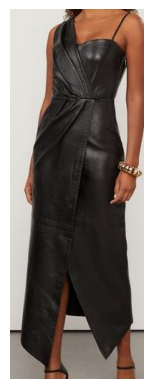

Similar: Blue color clothing - Distância: 0.67
Similar: Black color clothing - Distância: 0.75
Similar: Green color clothing - Distância: 0.97

Imagem: animale_images_cropped/calca/calca_calca-de-sarja-off-white-bolso-quadrado_off-white_25-34-1757-0003.jpg


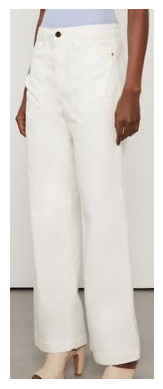

Similar: Green color clothing - Distância: 0.43
Similar: White color clothing - Distância: 0.86
Similar: Black color clothing - Distância: 0.93

Imagem: animale_images_cropped/vestido/vestido_vestido-de-couro-curto-faixa-assimetrica_bege-whitecap_07-20-6584-04346.jpg


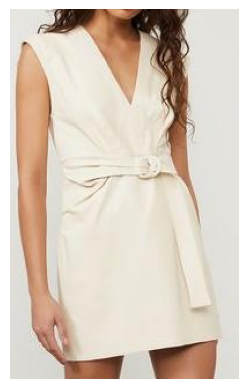

Similar: Green color clothing - Distância: 0.64
Similar: Brown color clothing - Distância: 0.89
Similar: Blue color clothing - Distância: 1.41



In [20]:
# Pegando 5 amostras aleatórias de imagens para comparar
sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 5)
img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]

files = df_base_categorizada.iloc[sample_indexes]['file_path'].values

similar_results = find_top_similar(
    embeddings_set1=img_embeddings_pca_sample,
    embeddings_set2=cores_embeddings_pca,
    n_top=3
)

for i, (indices, distances) in enumerate(similar_results):
    print(f"Imagem: {files[i]}")
    plot_image(files[i])  # Função para exibir a imagem
    for idx, dist in zip(indices, distances):  # Iterar sobre índice e distância simultaneamente
        description = description_list[idx]  
        print(f"Similar: {description} - Distância: {dist:.2f}")
    print()

- Confude bastante algumas cores, como [preto, azul, branco], [vermelho, rosa], [preto, verde] entre outras.

Visualizando as duas primeiras dimensões do PCA

In [21]:
img_embeddings_pca.shape

(766, 2)

Salvando colunas pca em df

In [22]:
# # Adicionando img_embeddings_pca ao df
# pca_cols = [f'pca_{i}' for i in range(img_embeddings_pca.shape[1])]
# print(pca_cols)
# df[pca_cols] = img_embeddings_pca
# print(f"df.shape: {df.shape}")
# df.head(1)

##### Visualizando espaço 2d

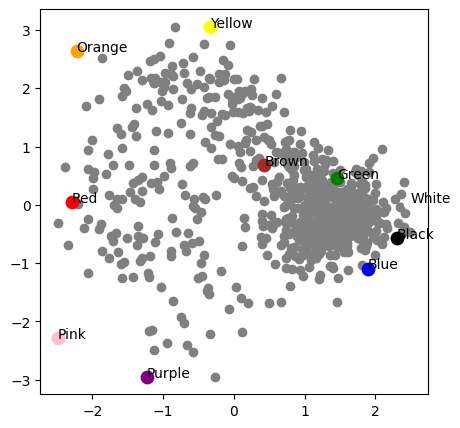

In [23]:
# Plot com as dimensões do PCA(X a dimensão 0, Y a dimensão 1) -usando apenas as duas primeiras dimensões de cores_embeddings_pca
plt.figure(figsize=(5, 5))

# # Plotando alguns exemplos de imagens nesse plot de cores
# sample = normalize_embeddings(sample, cores_embeddings_pca)

for i, (x, y) in enumerate(img_embeddings_pca[:, :2]):
    plt.scatter(x, y, color='gray')

for i, (x, y) in enumerate(cores_embeddings_pca[:, :2]):
    color = description_list[i].replace(" color clothing", "").replace("Roupa da cor ", "")
    # plotting colored according to the color value
    plt.scatter(x, y, color=color, s=80)
    plt.text(x, y, color)


Conseguimos perceber que as cores que ele confundiu mais estão mais próximas no espaço.
Os pontos cinzas que representam cada roupa estão muito espalhados e não há separação alguma entre cores nem nenhum tipo de clusterização.

#### 3 dimensões de PCA

In [24]:
# pca = PCA(n_components=3)
# cores_embeddings_pca = pca.fit_transform(cores_embeddings)
# cores_embeddings_pca.shape

# # Aplicando PCA nos embeddings de cores (descricoes) e imagens
# cores_embeddings_pca = pca.transform(cores_embeddings)
# img_embeddings_pca = pca.transform(img_embs)

In [25]:
cores_embeddings_pca, pca_cores_3d = apply_pca(cores_embeddings, n_components=3)
img_embeddings_pca, _ = apply_pca(img_embs, n_components=3, modelo_pca=pca_cores_3d)

Treinando um novo modelo PCA.
Usando modelo PCA fornecido.


In [26]:
img_embeddings_pca = normalize_embeddings(img_embeddings_pca, cores_embeddings_pca)

##### Top 3 cores para cada imagem

Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-tricot-laranja-com-amarracao-nas-costas_laranja-vibrante_52-13-5355-09249.jpg


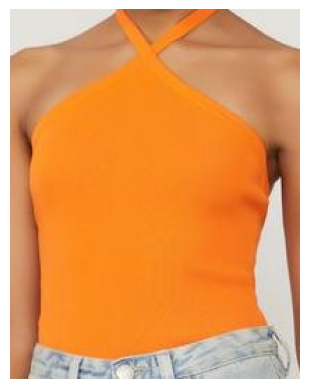

Similar: Orange color clothing - Score: 1.30
Similar: Yellow color clothing - Score: 2.00
Similar: Brown color clothing - Score: 2.26

Imagem: animale_images_cropped/blusa/top-blusa_top-de-georgette-pesado-frente-unica-preto_preto_52-10-5168-0005.jpg


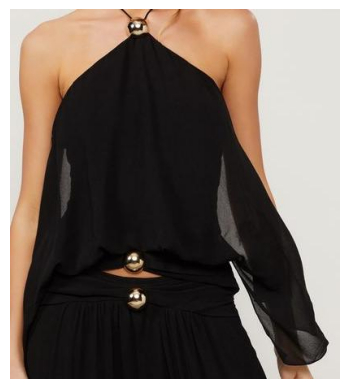

Similar: Black color clothing - Score: 0.94
Similar: Brown color clothing - Score: 1.39
Similar: White color clothing - Score: 1.47

Imagem: animale_images_cropped/blusa/top-blusa_t-shirt-de-malha-com-manga-curta_preto_52-06-0680-0005.jpg


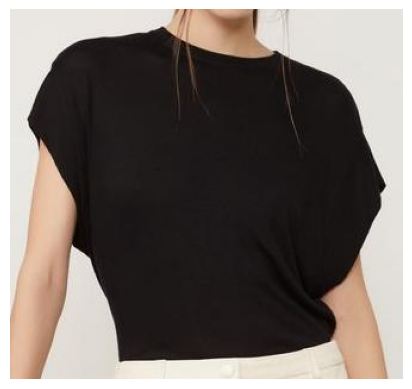

Similar: Black color clothing - Score: 0.93
Similar: White color clothing - Score: 1.08
Similar: Brown color clothing - Score: 1.47

Imagem: animale_images_cropped/vestido/vestido_vestido-de-couro-midi-alca-recortes_preto_07-20-6200-0005.jpg


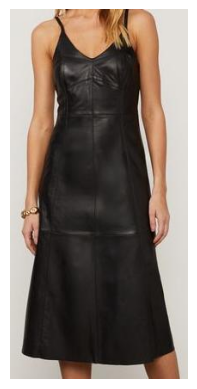

Similar: Black color clothing - Score: 1.21
Similar: Brown color clothing - Score: 1.47
Similar: White color clothing - Score: 1.94

Imagem: animale_images_cropped/blusa/top-blusa_blusa-manga-longa-textura-preta_preto_52-39-0257-0005.jpg


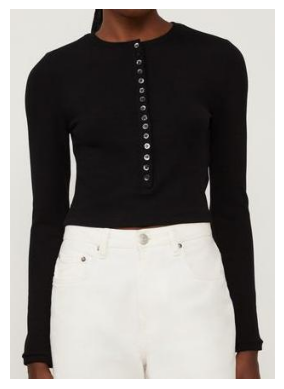

Similar: White color clothing - Score: 0.48
Similar: Black color clothing - Score: 0.60
Similar: Brown color clothing - Score: 2.47



In [27]:
# Pegando 5 amostras aleatórias de imagens para comparar
sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 5)
img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]

files = df_base_categorizada.iloc[sample_indexes]['file_path'].values

similar_results = find_top_similar(
    embeddings_set1=img_embeddings_pca_sample,
    embeddings_set2=cores_embeddings_pca,
    n_top=3
)

for i, (indices, distances) in enumerate(similar_results):
    print(f"Imagem: {files[i]}")
    plot_image(files[i])  # Função para exibir a imagem
    for idx, dist in zip(indices, distances):  # Iterar sobre índice e distância simultaneamente
        similar_id = df_base_categorizada.iloc[idx]['id_produto']  
        description = description_list[idx]  
        print(f"Similar: {description} - Score: {dist:.2f}")
    print()

##### Visualizando espaço 3d

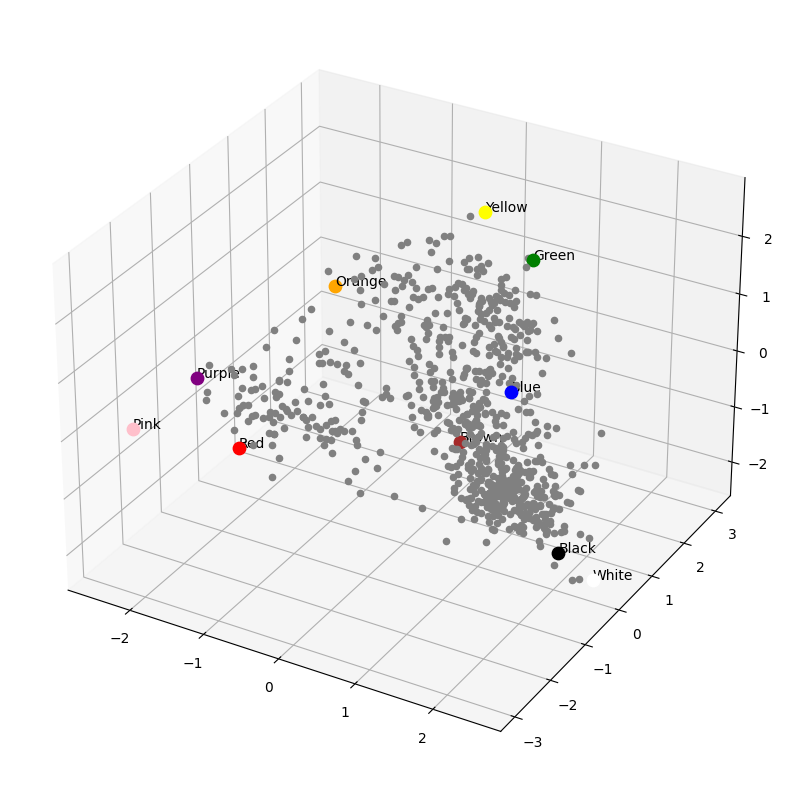

In [28]:
# Plot 3d com as dimensões do PCA(X a dimensão 0, Y a dimensão 1, Z a dimensão 2) -usando as três primeiras dimensões de cores_embeddings_pca
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

for i, (x, y, z) in enumerate(img_embeddings_pca[:, :3]):
    ax.scatter(x, y, z, color='gray')

for i, (x, y, z) in enumerate(cores_embeddings_pca[:, :3]):
    color = description_list[i].replace(" color clothing", "").replace("Roupa da cor ", "")
    # plotting colored according to the color value
    ax.scatter(x, y, z, color=color, s=80)
    ax.text(x, y, z, color)

Para 3 dimensões observamos um comportamento semelhante, com os pontos espalhados e sem uma noção clara de clusterização em torno das cores.

Está confundindo [marrom, azul], [marrom, preto] que são cores próximas no espaço.


---

Versão antiga - EXCLUIR

In [29]:
# # Pegando 10 amostras aleatórias de imagens para comparar
# sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 10)
# img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]

# files = df.iloc[sample_indexes]['file_path'].values

# similar_results = find_top_similar(
#     embeddings_set1=img_embeddings_pca_sample,
#     embeddings_set2=cores_embeddings_pca,
#     normalize=True,
#     n_top=3
# )

# for i, (indices, distances) in enumerate(similar_results):
#     print(f"Imagem: {files[i]}")
#     plot_image(files[i])  # Função para exibir a imagem
#     for idx, dist in zip(indices, distances):  # Iterar sobre índice e distância simultaneamente
#         similar_id = df.iloc[idx]['id_produto']  
#         description = description_list[idx]  
#         print(f"Similar: {description} - Score: {dist:.2f}")
#     print()

In [30]:
# # Refazendo PCA com 3 dimensões
# pca = PCA(n_components=3)
# cores_embeddings_pca = pca.fit_transform(cores_embeddings)
# img_embeddings_pca = pca.transform(img_embs)
# img_embeddings_pca = normalize_embeddings(img_embeddings_pca, cores_embeddings_pca)

# # Plot 3d com as dimensões do PCA(X a dimensão 0, Y a dimensão 1, Z a dimensão 2) -usando as três primeiras dimensões de cores_embeddings_pca

# from mpl_toolkits.mplot3d import Axes3D

# fig = plt.figure(figsize=(10, 10))
# ax = fig.add_subplot(111, projection='3d')

# for i, (x, y, z) in enumerate(sample[:, :3]):
#     ax.scatter(x, y, z, color='gray')

# for i, (x, y, z) in enumerate(cores_embeddings_pca[:, :3]):
#     color = description_list[i].replace(" color clothing", "").replace("Roupa da cor ", "")
#     # plotting colored according to the color value
#     ax.scatter(x, y, z, color=color, s=80)
#     ax.text(x, y, z, color)

In [31]:
####################### EXCLUIR ############################


# sample_indexes = random.sample(range(sample.shape[0]), 10)
# img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]
# files = df['file_path'].values[sample_indexes]

# # para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
# for i in range(img_embeddings_pca_sample.shape[1]):
#   min_value_color = cores_embeddings_pca[:, i].min()
#   max_value_color = cores_embeddings_pca[:, i].max()
#   min_value_img = img_embeddings_pca_sample[:, i].min()
#   max_value_img = img_embeddings_pca_sample[:, i].max()
#   img_embeddings_pca_sample[:, i] = (img_embeddings_pca_sample[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color


# # cos_sim = util.cos_sim(img_embeddings_pca_sample, cores_embeddings_pca)

# img_embeddings_pca_sample = torch.tensor(img_embeddings_pca_sample)
# cores_embeddings_pca = torch.tensor(cores_embeddings_pca)

# # Calcular distância euclidiana
# euclidean_dist = torch.cdist(img_embeddings_pca_sample, cores_embeddings_pca, p=2)

# for i, distance in enumerate(euclidean_dist):
#   print(f"Imagem: {df.iloc[i]['file_path']}")
#   plot_image(df.iloc[i]['file_path'])

#   # Garantir que distances esteja no CPU antes de converter para NumPy
#   if isinstance(distances, torch.Tensor):
#     distances = distances.cpu().numpy()
    
#   # Obter os 3 índices com menores distâncias (mais similares)
#   top_3_indices = distances.argsort()[:3]
    
#   for idx in top_3_indices:
#     similar_id = df.iloc[idx]['id_produto']
#     similar_score = distances[idx]
#     print(f"Similar: {description_list[idx]} - Score: {similar_score:.2f}")
#   print()
  
# # # Vendo top 3 cores mais próximas para um sample de imagens
# # for file_name, scores in zip(files, cos_sim):
# #   print(file_name)
# #   plot_image(file_name)
# #   # top 3 colors:
# #   scores = scores.numpy()
# #   top_3_indices = scores.argsort()
# #   for i in range(3):
# #     print(description_list[top_3_indices[-i-1]], f"{scores[top_3_indices[-i-1]]:.2f}")
# #   print()

In [32]:
# # Selecionando 10 índices aleatórios
# sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 10)
# img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]
# files = df.iloc[sample_indexes]['file_path'].values


# # Convertendo para tensores PyTorch
# img_embeddings_pca_sample = torch.tensor(img_embeddings_pca_sample, dtype=torch.float32)
# cores_embeddings_pca = torch.tensor(cores_embeddings_pca, dtype=torch.float32)

# # Escalando os embeddings das imagens para coincidir com os intervalos das cores
# for i in range(img_embeddings_pca_sample.shape[1]):
#     min_value_color = cores_embeddings_pca[:, i].min()
#     max_value_color = cores_embeddings_pca[:, i].max()
#     min_value_img = img_embeddings_pca_sample[:, i].min()
#     max_value_img = img_embeddings_pca_sample[:, i].max()
    
#     # Aplicando escalamento
#     img_embeddings_pca_sample[:, i] = (
#         (img_embeddings_pca_sample[:, i] - min_value_img) / 
#         (max_value_img - min_value_img) * 
#         (max_value_color - min_value_color) + min_value_color
#     )

# # Calculando distância euclidiana
# euclidean_dist = torch.cdist(img_embeddings_pca_sample, cores_embeddings_pca, p=2)

# # Iterando sobre cada imagem amostrada
# for idx, distances in enumerate(euclidean_dist):
#     file_path = files[idx]
#     print(f"Imagem: {file_path}")
#     plot_image(file_path)  # Função para exibir a imagem (garanta que está definida)
    
#     # Convertendo distances para NumPy, se necessário
#     if isinstance(distances, torch.Tensor):
#         distances = distances.cpu().numpy()
    
#     # Obtendo os 3 índices com menor distância
#     top_3_indices = distances.argsort()[:3]
    
#     # Exibindo resultados
#     for top_idx in top_3_indices:
#         similar_id = df.iloc[top_idx]['id_produto']  # Ajuste ao seu DataFrame
#         similar_score = distances[top_idx]
#         description = description_list[top_idx]  # Certifique-se de que está alinhado
#         print(f"Similar: {description} - Score: {similar_score:.2f}")
#     print()


---

Insights:

- O modelo está se confundindo porque as cores estão próximas no espaço, de forma que não há uma separação clara entre elas.

### Imagens personalizadas (blocos de cores)

In [33]:
# Agora, vamos gerar os embeddings das imagens das cores (color_images)
pasta = "color_images"

# Criando lista com as image_paths da pasta
image_paths = [os.path.join(pasta, path).replace('\\','/') for path in os.listdir(pasta)]

# Criando um df_color com os nomes das imagens
df_color = pd.DataFrame(image_paths, columns=["image_path"])
df_color["color_name"] = df_color["image_path"].apply(lambda x: x.split("/")[-1].split(".")[0])

In [34]:
# Criando colunas para os embeddings
emb_columns = [f"emb_img_{i}" for i in range(512)]

# Now we load and encode the images
def load_image(url_or_path):
    if url_or_path.startswith("http://") or url_or_path.startswith("https://"):
        return Image.open(requests.get(url_or_path, stream=True).raw)
    else:
        return Image.open(url_or_path)

file_names = df_color['image_path'].values
images = [load_image(img) for img in file_names]
img_embeddings = img_model.encode(images)

# Colocando os embeddings no df
emb_dict = {}
for i, emb in enumerate(img_embeddings):
    emb_id = df_color.iloc[i]["color_name"]
    emb_dict[emb_id] = emb

df_color_embs = pd.DataFrame(emb_dict).T

df_color_embs.columns = emb_columns
df_color_embs["color_name"] = df_color_embs.index

df_color_embs = df_color_embs.reset_index(drop=True)[["color_name"] + emb_columns]

In [35]:
df_color_embs

,color_name,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
0,COR AMARELO,-0.028545,-0.025496,-0.417673,-0.056402,-0.140226,-0.443519,-0.168441,1.078504,-0.078835,...,0.232356,0.274419,0.405922,-0.071532,-0.292983,0.232331,-0.101903,0.777710,0.010010,-0.121242
1,COR AZUL,0.006238,-0.045782,-0.431333,-0.097487,-0.076914,-0.385147,-0.291344,1.304192,0.383190,...,0.180391,0.044304,0.326409,-0.031872,-0.116065,0.203804,-0.297466,0.716892,-0.139596,-0.128783
2,COR BRANCO,-0.073344,-0.132770,0.253047,-0.082826,0.171033,-0.083862,-0.289972,1.193479,-0.287285,...,0.279241,-0.072687,0.708488,-0.181231,-0.050427,-0.001854,-0.256474,0.840972,-0.169232,-0.228157
3,COR LARANJA,-0.082441,-0.087324,-0.115959,-0.285203,-0.273470,-0.187084,-0.188148,1.037961,0.035577,...,0.334134,0.222016,0.296361,0.105040,-0.340744,0.146224,-0.089053,0.782471,-0.034351,-0.270654
4,COR MARROM,0.129687,-0.148728,-0.106386,-0.164459,0.040059,-0.307845,-0.089132,0.950700,-0.319956,...,0.173314,0.059058,0.779322,0.071892,-0.055109,0.132718,-0.255735,0.735227,-0.228709,-0.160291
5,COR PRETO,-0.150350,-0.263389,-0.565511,-0.072226,0.155787,-0.043085,-0.387121,1.272080,0.283594,...,-0.079255,0.158420,0.648814,0.091011,-0.028378,-0.349301,-0.134815,0.772287,-0.364340,-0.293392
6,COR ROSA,-0.232607,-0.244402,-0.232435,-0.443344,-0.170635,-0.438234,-0.085661,1.015443,0.581086,...,0.050129,-0.196673,0.175514,-0.057394,0.017285,0.326811,-0.417591,0.759209,-0.005310,0.089440
7,COR ROXO,-0.040681,-0.236614,-0.166357,-0.177385,-0.007183,-0.484710,-0.252690,0.917476,0.151761,...,0.206618,0.219410,0.186061,-0.069840,-0.291403,0.162623,-0.207237,0.765841,-0.102974,0.039639
8,COR VERDE,0.041701,-0.172500,-0.322558,-0.331833,-0.085318,-0.456009,-0.269159,1.154621,-0.010215,...,0.428415,0.234530,0.443847,-0.184217,-0.117773,-0.014541,-0.146755,0.745211,-0.273161,-0.027780
9,COR VERMELHO,0.002639,-0.210456,-0.319801,-0.206562,-0.054426,-0.474577,-0.110277,1.187309,0.389176,...,0.233479,0.212013,0.133249,-0.031382,-0.130834,0.189374,-0.217279,0.767862,-0.050193,-0.035196


#### 2 dimensões de PCA

In [36]:
# Pegando só as colunas de embeddings de df_color_embs
color_img_cols = [col for col in df_color_embs.columns if 'emb_img_' in col]
cores_embeddings = df_color_embs[color_img_cols].values

# Treinando PCA para os embeddings de cores e aplicando a mesma transformação para os embeddings de imagens
cores_embeddings_pca, pca_cores_2d = apply_pca(cores_embeddings, n_components=2)
img_embeddings_pca, _ = apply_pca(img_embs, modelo_pca=pca_cores_2d)

Treinando um novo modelo PCA.
Usando modelo PCA fornecido.


In [37]:
img_embeddings_pca = normalize_embeddings(img_embeddings_pca, cores_embeddings_pca)

Imagem: animale_images_cropped/vestido/vestido_vestido-longo-sem-alca-listrado_est-listra-cura-cogumelo-e-aura_07-20-6345-09554.jpg


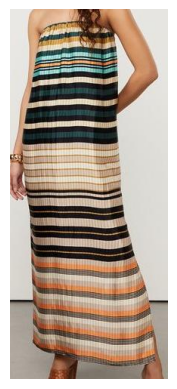

Cor 1: COR MARROM - Distância: 1.18
Cor 1: COR AMARELO - Distância: 1.24
Cor 1: COR LARANJA - Distância: 1.71

Imagem: animale_images_cropped/blusa/top-blusa_top-de-tricot-bege-cropped-com-decote-quadrado-basico_bege-gergelim_52-15-1386-09247.jpg


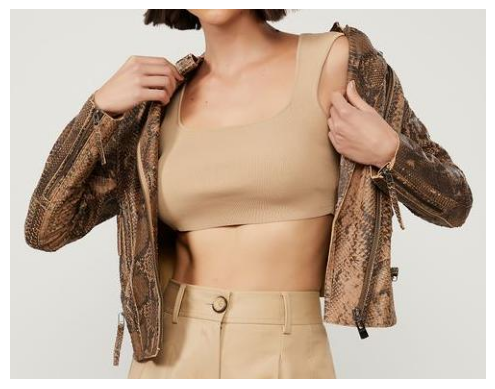

Cor 2: COR AZUL - Distância: 1.32
Cor 2: COR BRANCO - Distância: 1.50
Cor 2: COR AMARELO - Distância: 1.61

Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-tricot-preta-com-amarracao-nas-costas_preto_52-13-5271-0005.jpg


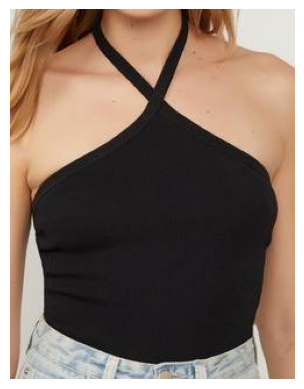

Cor 3: COR AZUL - Distância: 0.72
Cor 3: COR AMARELO - Distância: 0.83
Cor 3: COR VERDE - Distância: 1.58

Imagem: animale_images_cropped/vestido/vestido_vestido-longo-amarelo-papiro-com-abertur_amarelo-papiro_07-20-6385-01011.jpg


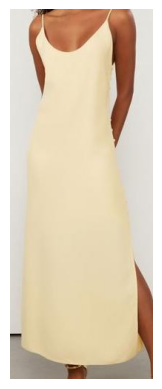

Cor 4: COR BRANCO - Distância: 1.36
Cor 4: COR AZUL - Distância: 1.51
Cor 4: COR AMARELO - Distância: 1.66

Imagem: animale_images_cropped/calca/calca_calca-de-couro-pantalona-cos-elastico-color_bege-golden_25-34-2135-04091.jpg


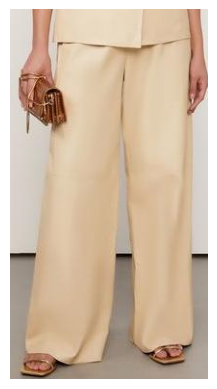

Cor 5: COR BRANCO - Distância: 1.31
Cor 5: COR MARROM - Distância: 1.35
Cor 5: COR AMARELO - Distância: 1.90



In [38]:
# Pegando 5 amostras aleatórias de imagens para comparar
sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 5)
img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]

files = df_base_categorizada.iloc[sample_indexes]['file_path'].values

similar_results = find_top_similar(
    embeddings_set1=img_embeddings_pca_sample,
    embeddings_set2=cores_embeddings_pca,
    n_top=3
)

for i, (indices, distances) in enumerate(similar_results):
    print(f"Imagem: {files[i]}")
    plot_image(files[i])  # Função para exibir a imagem
    for idx, dist in zip(indices, distances):  # Iterar sobre índice e distância simultaneamente
        color_name = df_color.iloc[idx]['color_name'] 
        similar_score = dist 
        description = description_list[idx]  
        print(f"Cor {i+1}: {color_name} - Distância: {similar_score:.2f}")
    print()

In [39]:

# img_embeddings_pca_sample = torch.tensor(img_embeddings_pca_sample, dtype=torch.float32)
# cores_embeddings_pca = torch.tensor(cores_embeddings_pca, dtype=torch.float32)

# # para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
# for i in range(img_embeddings_pca_sample.shape[1]):
#   min_value_color = cores_embeddings_pca[:, i].min()
#   max_value_color = cores_embeddings_pca[:, i].max()
#   min_value_img = img_embeddings_pca_sample[:, i].min()
#   max_value_img = img_embeddings_pca_sample[:, i].max()
#   img_embeddings_pca_sample[:, i] = (img_embeddings_pca_sample[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color


# # cos_sim = util.cos_sim(img_embeddings_pca_sample, cores_embeddings_pca)

# euclidean_dist = torch.cdist(img_embeddings_pca_sample, cores_embeddings_pca, p=2)

# # Iterar sobre cada imagem do sample e calcular as cores mais próximas
# for idx, distances in enumerate(euclidean_dist):
#     file_path = files[idx]
#     print(f"Imagem: {file_path}")
#     plot_image(file_path)  # Função para exibir a imagem (certifique-se de que está definida)
    
#     # Converter distances para NumPy, se necessário
#     if isinstance(distances, torch.Tensor):
#         distances = distances.cpu().numpy()
    
#     # Obter os índices das 3 menores distâncias (cores mais próximas)
#     top_3_indices = distances.argsort()[:3]
    
#     # Exibir os nomes das cores e os scores de similaridade
#     for i, top_idx in enumerate(top_3_indices):
#         color_name = df_color.iloc[top_idx]['color_name']  # Ajuste ao DataFrame de cores
#         similar_score = distances[top_idx]
#         print(f"Cor {i+1}: {color_name} - Score: {similar_score:.2f}")
#     print()

# # # para cada imagem, vendo a semelhança com cada cor
# # for file_name, scores in zip(files, cos_sim):
# #   print(file_name)
# #   plot_image(file_name)
# #   # top 3 colors:
# #   scores = scores.numpy()
# #   top_3_indices = scores.argsort()
# #   for i in range(3):
# #     print(df_color.iloc[top_3_indices[-i-1]]['color_name'], f"{scores[top_3_indices[-i-1]]:.2f}")
# #   print()

Se perdeu muito

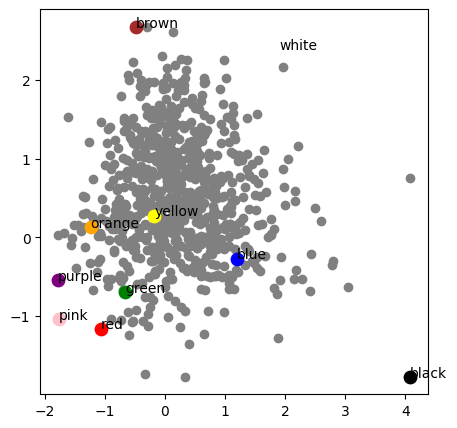

In [40]:
# Plot com as dimensões do PCA(X a dimensão 0, Y a dimensão 1) -usando apenas as duas primeiras dimensões de cores_embeddings_pca
plt.figure(figsize=(5, 5))

for i, (x, y) in enumerate(img_embeddings_pca[:, :2]):
    plt.scatter(x, y, color='gray')

colors_convert = { # dicionario para obter as cores em ingles para pintar corretamente o grafico
"AMARELO": "yellow",
"AZUL": "blue",
"BRANCO": "white",
"LARANJA": "orange",
"MARROM": "brown",
"PRETO": "black",
"ROSA": "pink",
"ROXO": "purple",
"VERDE": "green",
"VERMELHO": "red",
"CINZA": "gray"
}

for i, (x, y) in enumerate(cores_embeddings_pca[:, :2]):
    color = df_color['color_name'][i].replace("COR ", "")

    # Pegando nome da cor em inglês
    color = colors_convert[color]
    
    # plotting colored according to the color value
    plt.scatter(x, y, color=color, s=80)
    plt.text(x, y, color)

As cores ficaram amontoadas muito próximas, o modelo não capturou bem as cores.

#### 3 dimensões de PCA	

In [41]:
# Treinando PCA para os embeddings de cores e aplicando a mesma transformação para os embeddings de imagens
cores_embeddings_pca, pca_cores_3d = apply_pca(cores_embeddings, n_components=3)
img_embeddings_pca, _ = apply_pca(img_embs, modelo_pca=pca_cores_3d)

Treinando um novo modelo PCA.
Usando modelo PCA fornecido.


In [42]:
img_embeddings_pca = normalize_embeddings(img_embeddings_pca, cores_embeddings_pca)

Imagem: animale_images_cropped/vestido/vestido_vestido-de-twill-midi-corset-nude_nude-marzipan_07-20-6500-09251.jpg


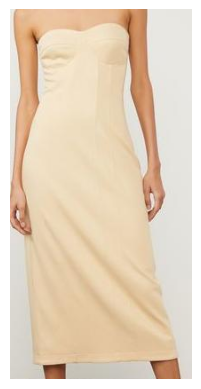

Cor 1: COR MARROM - Distância: 1.81
Cor 1: COR LARANJA - Distância: 1.97
Cor 1: COR ROXO - Distância: 2.60

Imagem: animale_images_cropped/vestido/vestido_vestido-midi-de-georgette-pesado-de-alca-decote-costas-estampado_est-floral-geometrico-block-color_07-20-6595-09546.jpg


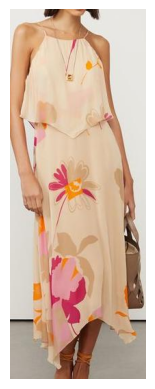

Cor 2: COR LARANJA - Distância: 1.87
Cor 2: COR MARROM - Distância: 1.94
Cor 2: COR ROXO - Distância: 2.57

Imagem: animale_images_cropped/vestido/vestido_vestido-de-tule-midi-estampado-com-detalhe-franzido_est-xadrez-daisy-kirli-e-cannes_07-20-6618-09634.jpg


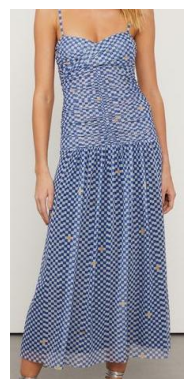

Cor 3: COR LARANJA - Distância: 1.29
Cor 3: COR AMARELO - Distância: 1.40
Cor 3: COR VERDE - Distância: 1.71

Imagem: animale_images_cropped/saia/saia_saia-jacquard-midi-marrom-cos-de-elastico_marrom-biscoito_25-11-1264-09260.jpg


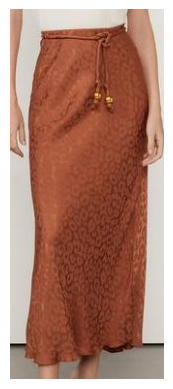

Cor 4: COR MARROM - Distância: 1.86
Cor 4: COR LARANJA - Distância: 2.22
Cor 4: COR AMARELO - Distância: 2.63

Imagem: animale_images_cropped/vestido/vestido_vestido-de-tule-midi-onca-com-detalhe-lateral-franzida_est-onca-solsticio_07-20-6933-09905.jpg


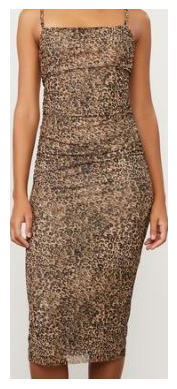

Cor 5: COR MARROM - Distância: 1.37
Cor 5: COR LARANJA - Distância: 3.00
Cor 5: COR ROXO - Distância: 3.48



In [43]:
# Pegando 5 amostras aleatórias de imagens para comparar
sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 5)
img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]

files = df_base_categorizada.iloc[sample_indexes]['file_path'].values

similar_results = find_top_similar(
    embeddings_set1=img_embeddings_pca_sample,
    embeddings_set2=cores_embeddings_pca,
    n_top=3
)

for i, (indices, distances) in enumerate(similar_results):
    print(f"Imagem: {files[i]}")
    plot_image(files[i])  # Função para exibir a imagem
    for idx, dist in zip(indices, distances):  # Iterar sobre índice e distância simultaneamente
        color_name = df_color.iloc[idx]['color_name'] 
        similar_score = dist 
        description = description_list[idx]  
        print(f"Cor {i+1}: {color_name} - Distância: {similar_score:.2f}")
    print()

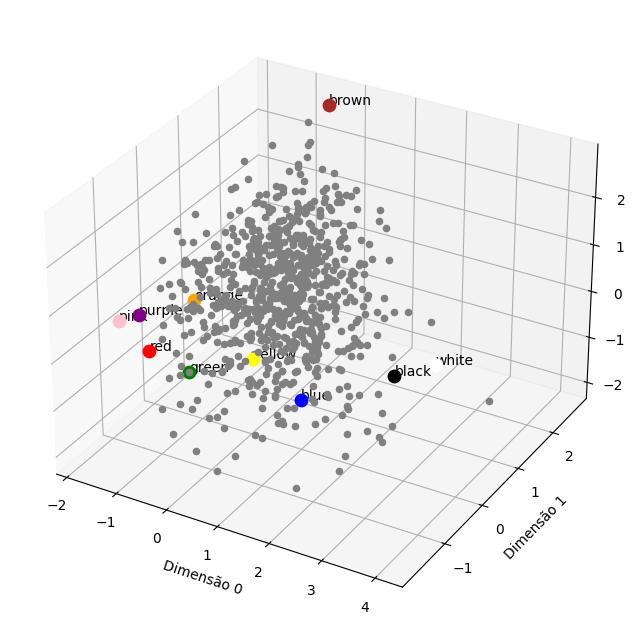

In [44]:
# Inicializando a figura e os eixos 3D
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# Plotando os pontos para img_embeddings_pca (dimensões 0, 1, 2)
for i, (x, y, z) in enumerate(img_embeddings_pca[:, :3]):  # Usando as 3 primeiras dimensões
    ax.scatter(x, y, z, color='gray')

# Plotando os pontos para cores_embeddings_pca (dimensões 0, 1, 2)
for i, (x, y, z) in enumerate(cores_embeddings_pca[:, :3]):  # Usando as 3 primeiras dimensões
    color = df_color['color_name'][i].replace("COR ", "")
    color = colors_convert[color]  # Convertendo a cor para o valor em inglês
    
    # Plotando os pontos coloridos
    ax.scatter(x, y, z, color=color, s=80)
    ax.text(x, y, z, color)  # Adicionando o nome da cor ao gráfico

# Ajustando rótulos dos eixos
ax.set_xlabel('Dimensão 0')
ax.set_ylabel('Dimensão 1')
ax.set_zlabel('Dimensão 2')

# Exibindo o gráfico
plt.show()

Insights:

- Mesmo com a padronização, as cores ainda estão muito próximas no espaço. É desejável transformar o espaço das cores base para distribuí-las mais uniformemente. 

- Uma alternativa, como mencionado anteriormente, seria realizar um fine-tunning com as imagens das roupas coloridas para seja possível compreender melhor as cores e clusterizar os produtos (tarefa não trivial)

## Visualizando espaços com dimensões maiores

Podemos utilizar UMAP para visualizar o espaço em dimensões maiores e tentar identificar padrões de agrupamento.

In [45]:
# # Função que aplica t-SNE para reduzir para duas dimensões
# from sklearn.manifold import TSNE
# from umap.umap_ import UMAP

# def apply_tsne(df, colunas, n_components=2, tsne=None):

#     if tsne is None:
#         # Removendo linhas com valores nulos para treinar o modelo

#         # Inicializando o modelo t-SNE
#         tsne = TSNE(n_components=n_components, random_state=42)

#         # Treinando o modelo e transformando os dados
#         componentes = tsne.fit_transform(df[colunas])

#         # Criando um novo DataFrame com as colunas desejadas
#         df_tsne = df[['id_produto', 'COR_PREDOMINANTE']].copy() 
#     else:
#         # Transformando os dados
#         componentes = tsne.transform(df[colunas])

#         # Criando um novo DataFrame com as colunas desejadas
#         df_tsne = df[['id_produto']].copy()

#     for i in range(n_components):
#         df_tsne[f'EMB_TSNE_{i}'] = componentes[:, i]

#     return df_tsne, tsne

# def apply_umap(df, colunas, n_components=2, umap=None):

#     if umap is None:
#         # Removendo linhas com valores nulos para treinar o modelo

#         # Inicializando o modelo t-SNE
#         umap = UMAP(n_components=n_components, random_state=42)

#         # Treinando o modelo e transformando os dados
#         componentes = umap.fit_transform(df[colunas])

#         # Criando um novo DataFrame com as colunas desejadas
#         df_umap = df[['id_produto', 'COR_PREDOMINANTE']].copy() 
#     else:
#         # Transformando os dados
#         componentes = umap.transform(df[colunas])

#         # Criando um novo DataFrame com as colunas desejadas
#         df_umap = df[['id_produto']].copy()

#     for i in range(n_components):
#         df_umap[f'EMB_UMAP_{i}'] = componentes[:, i]

#     return df_umap, umap

In [46]:
# # Merge entre as base para incluir COR_PREDOMINANTE em df_img_embs e df_text_embs
# df_img_embs = df_img_embs.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

# df_text_embs = df_text_embs.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

In [47]:
# df_img_embs['COR_PREDOMINANTE'].value_counts()

In [48]:
# # Aplicando apply_tsne para visualização dos embeddings de df_img_embs
# from utils.functions import apply_umap

# emb_cols_img = [col for col in df_img_embs.columns if 'emb_img_' in col]

# df_img_tsne, tsne_img_model = apply_umap(df_img_embs, emb_cols_img, n_components=2)

In [49]:
# df_img_tsne = df_img_tsne.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

In [50]:
# # Plot t-SNE usando plot_cores
# plot_cores(df_img_tsne, cor_column='COR_PREDOMINANTE', reducer='UMAP', color_dict=color_dict)

### Refazendo PCA com mais dimensões e visualizando com UMAP

#### DESCRIÇÕES PERSONALIZADAS

In [51]:
description_list

['Black color clothing',
 'White color clothing',
 'Red color clothing',
 'Yellow color clothing',
 'Green color clothing',
 'Blue color clothing',
 'Purple color clothing',
 'Brown color clothing',
 'Pink color clothing',
 'Orange color clothing']

In [52]:
cores_embeddings = text_model.encode(description_list)

In [53]:
img_embs = df_img_embs[emb_cols_img].values

In [54]:
# refazendo PCA com 10 dimensões
pca = PCA(n_components=10)
cores_embeddings_pca = pca.fit_transform(cores_embeddings)
img_embeddings_pca = pca.transform(img_embs)

In [55]:
# Adicionando img_embeddings_pca ao df
pca_cols = [f'EMB_PCA_{i}' for i in range(img_embeddings_pca.shape[1])]
print(pca_cols)
df_img_embs[pca_cols] = img_embeddings_pca
print(f"df.shape: {df_img_embs.shape}")
df_img_embs.head(1)

['EMB_PCA_0', 'EMB_PCA_1', 'EMB_PCA_2', 'EMB_PCA_3', 'EMB_PCA_4', 'EMB_PCA_5', 'EMB_PCA_6', 'EMB_PCA_7', 'EMB_PCA_8', 'EMB_PCA_9']
df.shape: (766, 524)


,id_produto,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,EMB_PCA_0,EMB_PCA_1,EMB_PCA_2,EMB_PCA_3,EMB_PCA_4,EMB_PCA_5,EMB_PCA_6,EMB_PCA_7,EMB_PCA_8,EMB_PCA_9
0,03-04-0464-0030,0.159315,-0.024293,-0.117268,0.017468,-0.192906,0.137711,-0.402171,-0.144309,0.939456,...,-0.96027,-0.387324,0.25811,0.293144,-0.486409,-0.494619,1.269617,0.510121,0.80055,1.659997


#### Plotando duas dimensões do PCA

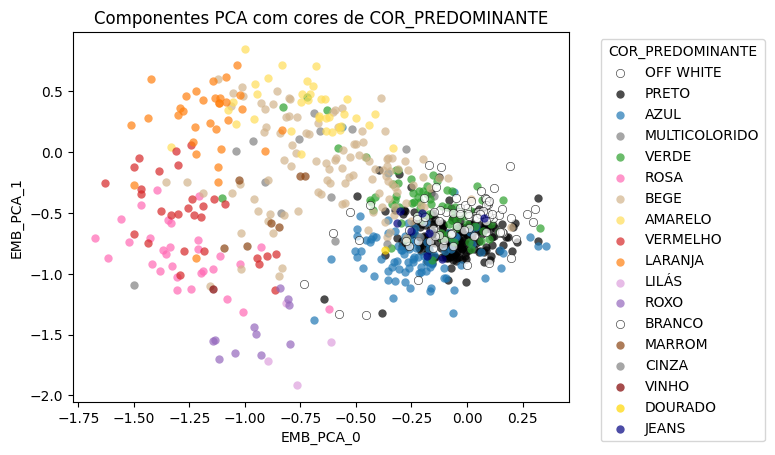

In [56]:
from utils.functions import plot_cores

plot_cores(df_img_embs, cor_column='COR_PREDOMINANTE', reducer='PCA', color_dict=color_dict)

In [57]:
df_img_embs['COR_PREDOMINANTE'].value_counts()

PRETO            195
BEGE             111
AZUL              96
BRANCO            87
VERDE             73
AMARELO           36
LARANJA           32
ROSA              30
VERMELHO          29
OFF_WHITE         29
MULTICOLORIDO     13
ROXO              11
JEANS              8
MARROM             7
LILÁS              4
CINZA              3
VINHO              1
DOURADO            1
Name: COR_PREDOMINANTE, dtype: int64

In [58]:
# Aplicando apply_tsne para visualização dos embeddings de df_img_embs
df_img_pca_umap, tsne_img_pca_model = apply_umap(df_img_embs, pca_cols, n_components=2)

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [59]:
df_img_pca_umap

,id_produto,EMB_UMAP_0,EMB_UMAP_1
0,03-04-0464-0030,1.216215,3.606618
1,03-04-0478-6048,1.901046,2.300156
2,03-04-0460-0003,-1.681967,6.874178
3,03-04-0461-0005,6.870529,6.912914
4,03-04-0479-0024,-1.063405,6.751295
...,...,...,...
761,07-20-6778-0005,9.010709,6.350196
762,07-20-6402-09248,1.421660,1.487320
763,07-20-6401-0005,7.894030,5.534731
764,07-20-6659-09538,3.172600,4.093313


In [60]:
df_img_pca_umap = df_img_pca_umap.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

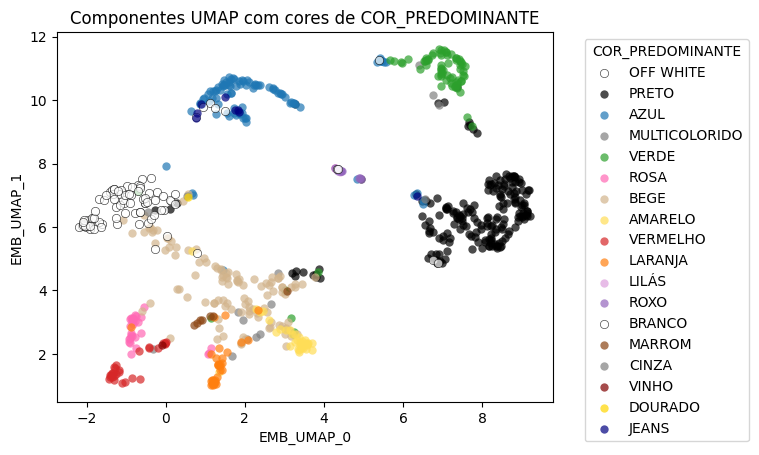

In [61]:
plot_cores(df_img_pca_umap, cor_column='COR_PREDOMINANTE', reducer='UMAP', color_dict=color_dict)

O PCA sozinho já consegue separar as cores de forma mais clara, mas ainda não é o suficiente.

In [62]:
img_embeddings_pca = normalize_embeddings(img_embeddings_pca, cores_embeddings_pca)

Imagem: animale_images_cropped/blusa/top-blusa_camiseta-tricot-com-textura_preto_52-06-0637-0005.jpg


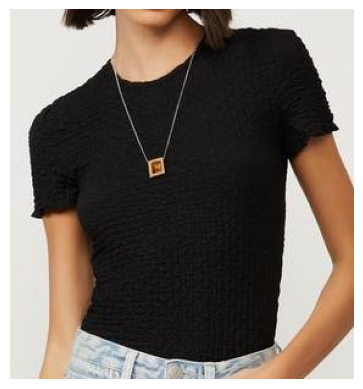

Similar: Black color clothing - Score: 2.97
Similar: Brown color clothing - Score: 3.53
Similar: White color clothing - Score: 4.55

Imagem: animale_images_cropped/calca/calca_calca-jeans-nipper-stoned_jeans-medio_25-34-1781-0105.jpg


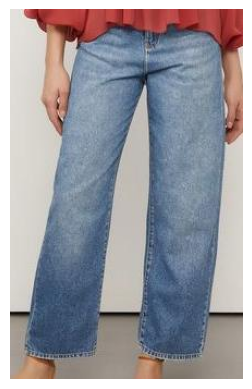

Similar: Blue color clothing - Score: 3.12
Similar: Red color clothing - Score: 4.28
Similar: Brown color clothing - Score: 4.37

Imagem: animale_images_cropped/blusa/top-blusa_regata-de-tricot-laranja-com-gola-alta-basico_laranja-vibrante_52-13-5346-09249.jpg


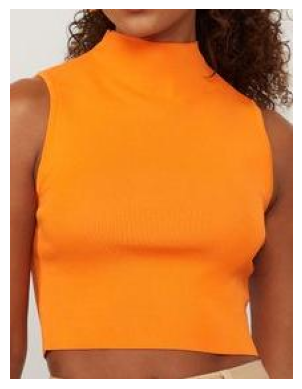

Similar: Orange color clothing - Score: 1.49
Similar: Yellow color clothing - Score: 4.98
Similar: Brown color clothing - Score: 5.07

Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-tricot-com-manga-longa-e-decote-redondo-color-lilas_lilas-nuvem_52-13-4927-09040.jpg


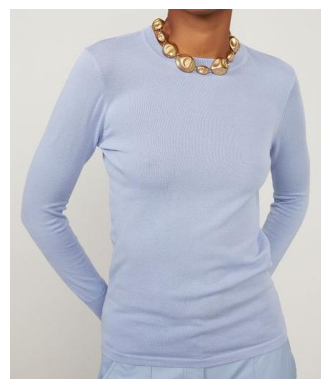

Similar: Blue color clothing - Score: 2.57
Similar: Purple color clothing - Score: 4.61
Similar: Brown color clothing - Score: 4.81

Imagem: animale_images_cropped/calca/calca_calca-jacquard-cenoura-azul-bolso-com-pregas_azul-hortensia_25-34-1719-04501.jpg


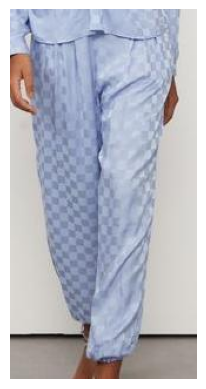

Similar: Blue color clothing - Score: 2.37
Similar: White color clothing - Score: 4.36
Similar: Brown color clothing - Score: 4.74



In [63]:
# Pegando 5 amostras aleatórias de imagens para comparar
sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 5)
img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]

files = df_base_categorizada.iloc[sample_indexes]['file_path'].values

similar_results = find_top_similar(
    embeddings_set1=img_embeddings_pca_sample,
    embeddings_set2=cores_embeddings_pca,
    n_top=3
)

for i, (indices, distances) in enumerate(similar_results):
    print(f"Imagem: {files[i]}")
    plot_image(files[i])  # Função para exibir a imagem
    for idx, dist in zip(indices, distances):  # Iterar sobre índice e distância simultaneamente
        similar_id = df_base_categorizada.iloc[idx]['id_produto']  
        description = description_list[idx]  
        print(f"Similar: {description} - Score: {dist:.2f}")
    print()

In [64]:
# # Pegando 10 imagens aleatórias
# sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 20)
# img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]
# files = df_base_categorizada['file_path'].values[sample_indexes]

# img_embeddings_pca_sample = torch.tensor(img_embeddings_pca_sample, dtype=torch.float32)
# cores_embeddings_pca = torch.tensor(cores_embeddings_pca, dtype=torch.float32)

# # para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
# for i in range(img_embeddings_pca_sample.shape[1]):
#     min_value_color = cores_embeddings_pca[:, i].min()
#     max_value_color = cores_embeddings_pca[:, i].max()
#     min_value_img = img_embeddings_pca_sample[:, i].min()
#     max_value_img = img_embeddings_pca_sample[:, i].max()
#     img_embeddings_pca_sample[:, i] = (img_embeddings_pca_sample[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color


# # cos_sim = util.cos_sim(img_embeddings_pca_sample, cores_embeddings_pca)
# euclidean_dist = torch.cdist(img_embeddings_pca_sample, cores_embeddings_pca, p=2)

# # Refazendo com euclidean_dist
# for i, distances in enumerate(euclidean_dist):
#     print(f"Imagem: {files[i]}")
#     plot_image(files[i])  # Função para exibir a imagem
    
#     # Convertendo distances para NumPy, se necessário
#     if isinstance(distances, torch.Tensor):
#         distances = distances.cpu().numpy()
    
#     # Obtendo os 3 índices com menor distância
#     top_3_indices = distances.argsort()[:3]
    
#     # Exibindo os resultados
#     for idx in top_3_indices:
#         similar_id = df_img_embs.iloc[idx]['id_produto']  
#         similar_score = distances[idx]
#         description = description_list[idx]  
#         print(f"Similar: {description} - Score: {similar_score:.2f}")
#     print()

Muuuito melhor com 10 dimensões! Conseguimos ver uma separação mais clara das cores.

Ideia para resolver um possível problema: 
Incluir grupo do produto ao invés de cloting. Ex: black color top ao inves de black color clothing.

Um subespaço por grupo de produto?

#### IMAGENS PERSONALIZADAS

In [65]:
# Agora, vamos gerar os embeddings das imagens das cores (color_images)
pasta = "color_images"

# Criando lista com as image_paths da pasta
image_paths = [os.path.join(pasta, path).replace('\\','/') for path in os.listdir(pasta)]

# Criando um df_color com os nomes das imagens
df_color = pd.DataFrame(image_paths, columns=["image_path"])
df_color["color_name"] = df_color["image_path"].apply(lambda x: x.split("/")[-1].split(".")[0])

In [66]:
# Criando colunas para os embeddings
emb_columns = [f"emb_img_{i}" for i in range(512)]

# Now we load and encode the images
def load_image(url_or_path):
    if url_or_path.startswith("http://") or url_or_path.startswith("https://"):
        return Image.open(requests.get(url_or_path, stream=True).raw)
    else:
        return Image.open(url_or_path)

file_names = df_color['image_path'].values
images = [load_image(img) for img in file_names]
img_embeddings = img_model.encode(images)

# Colocando os embeddings no df
emb_dict = {}
for i, emb in enumerate(img_embeddings):
    emb_id = df_color.iloc[i]["color_name"]
    emb_dict[emb_id] = emb

df_color_embs = pd.DataFrame(emb_dict).T

df_color_embs.columns = emb_columns
df_color_embs["color_name"] = df_color_embs.index

df_color_embs = df_color_embs.reset_index(drop=True)[["color_name"] + emb_columns]

In [67]:
df_color_embs

,color_name,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
0,COR AMARELO,-0.028545,-0.025496,-0.417673,-0.056402,-0.140226,-0.443519,-0.168441,1.078504,-0.078835,...,0.232356,0.274419,0.405922,-0.071532,-0.292983,0.232331,-0.101903,0.777710,0.010010,-0.121242
1,COR AZUL,0.006238,-0.045782,-0.431333,-0.097487,-0.076914,-0.385147,-0.291344,1.304192,0.383190,...,0.180391,0.044304,0.326409,-0.031872,-0.116065,0.203804,-0.297466,0.716892,-0.139596,-0.128783
2,COR BRANCO,-0.073344,-0.132770,0.253047,-0.082826,0.171033,-0.083862,-0.289972,1.193479,-0.287285,...,0.279241,-0.072687,0.708488,-0.181231,-0.050427,-0.001854,-0.256474,0.840972,-0.169232,-0.228157
3,COR LARANJA,-0.082441,-0.087324,-0.115959,-0.285203,-0.273470,-0.187084,-0.188148,1.037961,0.035577,...,0.334134,0.222016,0.296361,0.105040,-0.340744,0.146224,-0.089053,0.782471,-0.034351,-0.270654
4,COR MARROM,0.129687,-0.148728,-0.106386,-0.164459,0.040059,-0.307845,-0.089132,0.950700,-0.319956,...,0.173314,0.059058,0.779322,0.071892,-0.055109,0.132718,-0.255735,0.735227,-0.228709,-0.160291
5,COR PRETO,-0.150350,-0.263389,-0.565511,-0.072226,0.155787,-0.043085,-0.387121,1.272080,0.283594,...,-0.079255,0.158420,0.648814,0.091011,-0.028378,-0.349301,-0.134815,0.772287,-0.364340,-0.293392
6,COR ROSA,-0.232607,-0.244402,-0.232435,-0.443344,-0.170635,-0.438234,-0.085661,1.015443,0.581086,...,0.050129,-0.196673,0.175514,-0.057394,0.017285,0.326811,-0.417591,0.759209,-0.005310,0.089440
7,COR ROXO,-0.040681,-0.236614,-0.166357,-0.177385,-0.007183,-0.484710,-0.252690,0.917476,0.151761,...,0.206618,0.219410,0.186061,-0.069840,-0.291403,0.162623,-0.207237,0.765841,-0.102974,0.039639
8,COR VERDE,0.041701,-0.172500,-0.322558,-0.331833,-0.085318,-0.456009,-0.269159,1.154621,-0.010215,...,0.428415,0.234530,0.443847,-0.184217,-0.117773,-0.014541,-0.146755,0.745211,-0.273161,-0.027780
9,COR VERMELHO,0.002639,-0.210456,-0.319801,-0.206562,-0.054426,-0.474577,-0.110277,1.187309,0.389176,...,0.233479,0.212013,0.133249,-0.031382,-0.130834,0.189374,-0.217279,0.767862,-0.050193,-0.035196


In [68]:
# Pegando só as colunas de embeddings de df_color_embs
color_img_cols = [col for col in df_color_embs.columns if 'emb_img_' in col]
cores_embeddings = df_color_embs[color_img_cols].values

# Usar PCA nos embs das cores
pca = PCA(n_components=10)
cores_embeddings_pca = pca.fit_transform(cores_embeddings)
img_embeddings_pca = pca.transform(img_embs)
cores_embeddings_pca.shape

(10, 10)

In [69]:
# Adicionando img_embeddings_pca ao df
pca_cols = [f'EMB_PCA_{i}' for i in range(img_embeddings_pca.shape[1])]
print(pca_cols)
df_img_embs[pca_cols] = img_embeddings_pca
print(f"df.shape: {df_img_embs.shape}")
df_img_embs.head(1)

['EMB_PCA_0', 'EMB_PCA_1', 'EMB_PCA_2', 'EMB_PCA_3', 'EMB_PCA_4', 'EMB_PCA_5', 'EMB_PCA_6', 'EMB_PCA_7', 'EMB_PCA_8', 'EMB_PCA_9']
df.shape: (766, 524)


,id_produto,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,EMB_PCA_0,EMB_PCA_1,EMB_PCA_2,EMB_PCA_3,EMB_PCA_4,EMB_PCA_5,EMB_PCA_6,EMB_PCA_7,EMB_PCA_8,EMB_PCA_9
0,03-04-0464-0030,0.159315,-0.024293,-0.117268,0.017468,-0.192906,0.137711,-0.402171,-0.144309,0.939456,...,-0.282983,1.264261,1.560805,1.591554,-0.399891,0.78324,0.52326,-0.353252,0.655713,1.340301


In [70]:
df_img_embs['COR_PREDOMINANTE'].value_counts()

PRETO            195
BEGE             111
AZUL              96
BRANCO            87
VERDE             73
AMARELO           36
LARANJA           32
ROSA              30
VERMELHO          29
OFF_WHITE         29
MULTICOLORIDO     13
ROXO              11
JEANS              8
MARROM             7
LILÁS              4
CINZA              3
VINHO              1
DOURADO            1
Name: COR_PREDOMINANTE, dtype: int64

In [71]:
# Aplicando apply_umap para visualização dos embeddings de df_img_embs
df_img_pca_umap, umap_img_pca_model = apply_umap(df_img_embs, pca_cols, n_components=2)

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [72]:
df_img_pca_umap = df_img_pca_umap.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

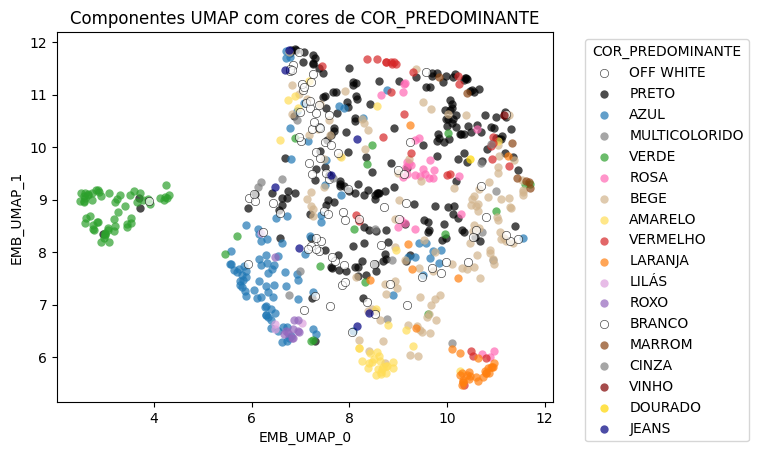

In [73]:
plot_cores(df_img_pca_umap, cor_column='COR_PREDOMINANTE', reducer='UMAP', color_dict=color_dict)

Não deu certo usar as cores sólidas. Só algumas cores se clusterizaram.

In [74]:
img_embeddings_pca = normalize_embeddings(img_embeddings_pca, cores_embeddings_pca)

Imagem: animale_images_cropped/blusa/top-blusa_t-shirt-basica-manga-curta-estampada-onca_est-onca-elixir-color_52-06-0648-09660.jpg


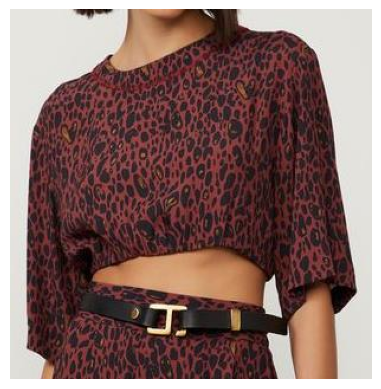

Cor 1: COR MARROM - Distância: 2.68
Cor 1: COR LARANJA - Distância: 3.40
Cor 1: COR ROXO - Distância: 3.41

Imagem: animale_images_cropped/blusa/camisa_camisa-de-manga-presunto_branco_52-05-1455-0002.jpg


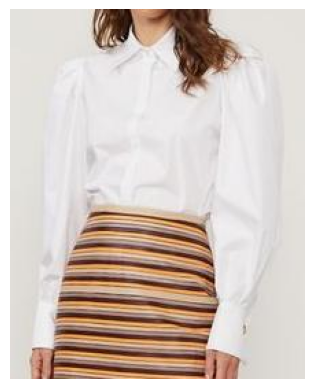

Cor 2: COR AMARELO - Distância: 2.95
Cor 2: COR AZUL - Distância: 3.28
Cor 2: COR MARROM - Distância: 3.31

Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-malha-com-decote-v-e-manga-longa-raglan_branco_52-13-5456-0001.jpg


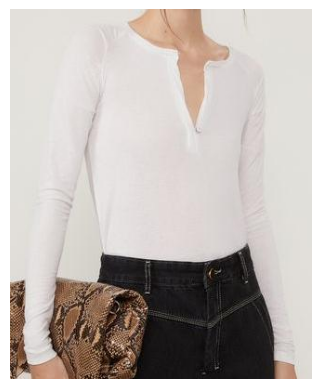

Cor 3: COR AZUL - Distância: 3.10
Cor 3: COR AMARELO - Distância: 3.27
Cor 3: COR BRANCO - Distância: 3.43

Imagem: animale_images_cropped/calca/calca_calca-de-algodao-khaki_caqui_25-34-1409-0278.jpg


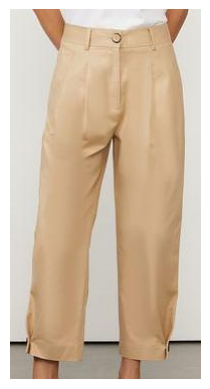

Cor 4: COR BRANCO - Distância: 3.00
Cor 4: COR AMARELO - Distância: 3.05
Cor 4: COR MARROM - Distância: 3.45

Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-tricot-com-manga-longa-e-decote-redondo-color-mescla_mescla-escuro_52-13-4926-0015.jpg


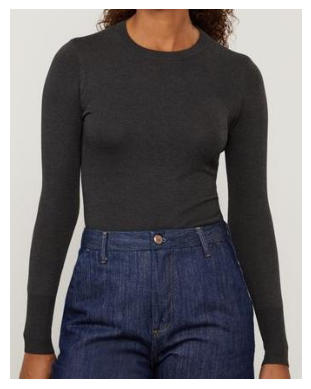

Cor 5: COR AZUL - Distância: 2.53
Cor 5: COR AMARELO - Distância: 2.76
Cor 5: COR VERMELHO - Distância: 3.58



In [75]:
# Pegando 5 amostras aleatórias de imagens para comparar
sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 5)
img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]

files = df_base_categorizada.iloc[sample_indexes]['file_path'].values

similar_results = find_top_similar(
    embeddings_set1=img_embeddings_pca_sample,
    embeddings_set2=cores_embeddings_pca,
    n_top=3
)

for i, (indices, distances) in enumerate(similar_results):
    print(f"Imagem: {files[i]}")
    plot_image(files[i])  # Função para exibir a imagem
    for idx, dist in zip(indices, distances):  # Iterar sobre índice e distância simultaneamente
        color_name = df_color.iloc[idx]['color_name'] 
        similar_score = dist 
        description = description_list[idx]  
        print(f"Cor {i+1}: {color_name} - Distância: {similar_score:.2f}")
    print()

In [76]:
# # Pegando 10 imagens aleatórias
# sample_indexes = random.sample(range(img_embeddings_pca.shape[0]), 5)
# img_embeddings_pca_sample = img_embeddings_pca[sample_indexes]
# files = df['file_path'].values[sample_indexes]

# img_embeddings_pca_sample = torch.tensor(img_embeddings_pca_sample, dtype=torch.float32)
# cores_embeddings_pca = torch.tensor(cores_embeddings_pca, dtype=torch.float32)

# # para cada dimensão do vetor de PCA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
# for i in range(img_embeddings_pca_sample.shape[1]):
#     min_value_color = cores_embeddings_pca[:, i].min()
#     max_value_color = cores_embeddings_pca[:, i].max()
#     min_value_img = img_embeddings_pca_sample[:, i].min()
#     max_value_img = img_embeddings_pca_sample[:, i].max()
#     img_embeddings_pca_sample[:, i] = (img_embeddings_pca_sample[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color


# # cos_sim = util.cos_sim(img_embeddings_pca_sample, cores_embeddings_pca)
# euclidean_dist = torch.cdist(img_embeddings_pca_sample, cores_embeddings_pca, p=2)

# # # para cada imagem, vendo a semelhança com cada cor
# # for file_name, scores in zip(files, cos_sim):
# #   print(file_name)
# #   plot_image(file_name)

# #   # top 3 colors:
# #   scores = scores.numpy()
# #   top_3_indices = scores.argsort()
# #   for i in range(3):
# #     print(description_list[top_3_indices[-i-1]], f"{scores[top_3_indices[-i-1]]:.2f}")
# #   print()

# for i, distances in enumerate(euclidean_dist):
#     print(f"Imagem: {files[i]}")
#     plot_image(files[i])  # Função para exibir a imagem
    
#     # Convertendo distances para NumPy, se necessário
#     if isinstance(distances, torch.Tensor):
#         distances = distances.cpu().numpy()
    
#     # Obtendo os 3 índices com menor distância
#     top_3_indices = distances.argsort()[:3]
    
#     # Exibindo os resultados
#     for idx in top_3_indices:
#         similar_id = df_img_embs.iloc[idx]['id_produto']  
#         similar_score = distances[idx]
#         description = description_list[idx]  
#         print(f"Similar: {description} - Score: {similar_score:.2f}")
#     print()

## 2° Abordagem: LDA

In [77]:
df_img_embs = pd.read_parquet('datasets/img_embeddings.parquet')
embs_cols = [col for col in df_img_embs.columns if 'emb_img_' in col]

In [78]:
# Adicionando coluna COR_PREDOMINANTE
df_img_embs = df_img_embs.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

In [79]:
df_img_embs['COR_PREDOMINANTE'].value_counts()

PRETO            195
BEGE             111
AZUL              96
BRANCO            87
VERDE             73
AMARELO           36
LARANJA           32
ROSA              30
VERMELHO          29
OFF_WHITE         29
MULTICOLORIDO     13
ROXO              11
JEANS              8
MARROM             7
LILÁS              4
CINZA              3
VINHO              1
DOURADO            1
Name: COR_PREDOMINANTE, dtype: int64

In [80]:
# DOURADO -> AMARELO
# OFF WHITE -> BRANCO
# JEANS -> AZUL
# VINHO -> ROXO

# Substituindo valores de COR_PREDOMINANTE
df_img_embs['COR_PREDOMINANTE'] = df_img_embs['COR_PREDOMINANTE'].replace({
    'DOURADO': 'AMARELO',
    'OFF_WHITE': 'BRANCO',
    'JEANS': 'AZUL',
    'VINHO': 'ROXO',
    'LILÁS': 'ROXO'
})


In [81]:
df_img_embs['COR_PREDOMINANTE'].value_counts()

PRETO            195
BRANCO           116
BEGE             111
AZUL             104
VERDE             73
AMARELO           37
LARANJA           32
ROSA              30
VERMELHO          29
ROXO              16
MULTICOLORIDO     13
MARROM             7
CINZA              3
Name: COR_PREDOMINANTE, dtype: int64

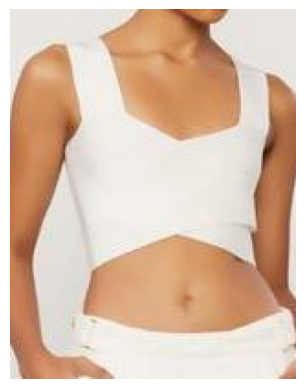

BRANCO



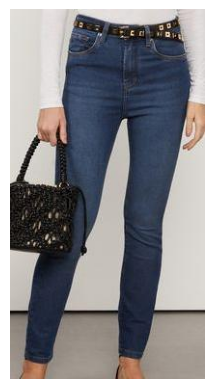

AZUL



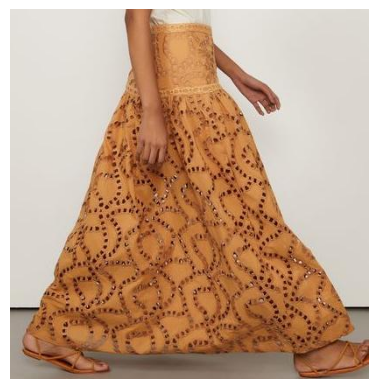

BEGE



In [82]:
# Plotanto algumas imagens e suas respectivas cores
sample_indexes = random.sample(range(df_img_embs.shape[0]), 3)
sample = df_base_categorizada.iloc[sample_indexes]

for i, row in sample.iterrows():
    plot_image(row['file_path'])
    print(row['COR_PREDOMINANTE'])
    print()

In [83]:
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# # Função que aplica LDA: recebe um df, as colunas desse df que contêm os embeddings e o número de componentes que se deseja obter
# def apply_lda(df, colunas, n_components=2, lda=None):
#     """
#     Aplica LDA nos embeddings para redução de dimensionalidade com base na coluna 'COR_PREDOMINANTE',
#     ignorando valores nulos na coluna de target e retornando um novo DataFrame com as colunas desejadas.
#     """
#     df_filtered = df.copy()

#     if not lda:
#         # Inicializando o modelo LDA
#         lda = LinearDiscriminantAnalysis(n_components=n_components)

#         # Filtrando os dados para remover nulos na coluna 'COR_PREDOMINANTE'
#         df_filtered = df_filtered.dropna(subset=['COR_PREDOMINANTE'])

#         # Treinando o modelo e transformando os dados
#         componentes = lda.fit_transform(df_filtered[colunas], df_filtered['COR_PREDOMINANTE'])

#         # Criando um novo DataFrame com as colunas desejadas
#         df_lda = df_filtered[['id_produto', 'COR_PREDOMINANTE']].copy()

#     else:
#         componentes = lda.transform(df_filtered[colunas])

#         # Criando um novo DataFrame com as colunas desejadas
#         df_lda = df_filtered[['id_produto']].copy()

#     for i in range(n_components):
#         df_lda[f'EMB_LDA_{i}'] = componentes[:, i]

#     return df_lda, lda

In [84]:
from utils.functions import apply_lda

# Aplicando LDA e retornando o DataFrame ajustado
df_lda, lda_model  = apply_lda(df_img_embs, embs_cols, 10, column_target='COR_PREDOMINANTE')

In [87]:
import pickle

# Salvando o modelo LDA
with open('lda_model_cor.pkl', 'wb') as f:
    pickle.dump(lda_model, f)

In [88]:
df_lda.sample(5)

,id_produto,COR_PREDOMINANTE,EMB_LDA_0,EMB_LDA_1,EMB_LDA_2,EMB_LDA_3,EMB_LDA_4,EMB_LDA_5,EMB_LDA_6,EMB_LDA_7,EMB_LDA_8,EMB_LDA_9
297,52-13-5271-0005,PRETO,10.401835,-1.387126,-0.523183,-1.902894,-0.299271,0.147567,-0.735809,0.744642,0.630947,-1.034756
157,25-34-1658-09600,BRANCO,-2.162000,-1.316273,3.722404,-2.755902,4.983696,-0.167937,0.848763,0.348723,3.543597,-1.744210
140,25-34-2092-1530,AZUL,-0.824635,8.681244,5.679535,6.573551,-2.692889,-1.863638,-0.538846,1.260761,1.466194,-1.290149
661,07-20-6550-09253,VERDE,-2.182073,9.179030,-5.678905,-6.001994,0.278570,0.623497,-0.519181,-1.108432,-0.049685,0.816015
429,52-06-0694-8259,VERMELHO,-6.509907,-3.566362,-7.250500,7.992245,3.551352,-1.167608,-2.281448,-4.973222,-0.161240,7.905876


In [89]:
# Função t-SNE
colunas_lda = [col for col in df_lda.columns if 'EMB_LDA' in col]

# Aplicando t-SNE e retornando o DataFrame ajustado
df_umap, umap_model = apply_umap(df_lda, colunas_lda, 2)

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [90]:
df_umap = df_umap.merge(df_base_categorizada[['id_produto', 'COR_PREDOMINANTE']], on='id_produto')

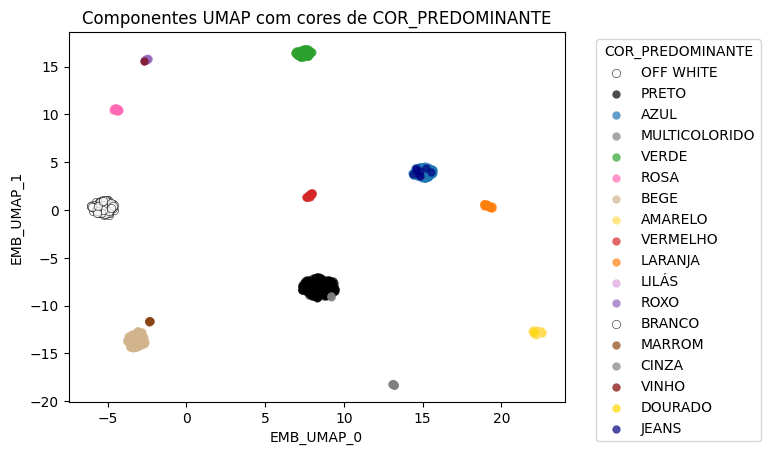

In [91]:
# Plotando o resultado do t-SNE
plot_cores(df_umap, cor_column='COR_PREDOMINANTE', reducer='UMAP', color_dict=color_dict)

In [187]:
description_list

['Black color clothing',
 'White color clothing',
 'Red color clothing',
 'Yellow color clothing',
 'Green color clothing',
 'Blue color clothing',
 'Purple color clothing',
 'Brown color clothing',
 'Pink color clothing',
 'Orange color clothing']

In [188]:
# Gerar embeddings das cores
cores_embeddings = text_model.encode(description_list)

In [189]:
# Criando um DataFrame com os embeddings das cores
df_cores = pd.DataFrame(cores_embeddings, columns=[f'EMB_{i}' for i in range(cores_embeddings.shape[1])])

In [190]:
df_cores

,EMB_0,EMB_1,EMB_2,EMB_3,EMB_4,EMB_5,EMB_6,EMB_7,EMB_8,EMB_9,...,EMB_502,EMB_503,EMB_504,EMB_505,EMB_506,EMB_507,EMB_508,EMB_509,EMB_510,EMB_511
0,0.278168,0.097347,-0.121005,0.225943,0.205412,-0.335329,0.134802,-0.953954,0.713841,0.055741,...,-0.081756,0.418288,0.564023,-0.275429,-0.340022,0.064276,0.186769,0.396663,0.181738,0.229109
1,-0.172607,-0.100618,0.068171,0.310801,-0.261451,0.011997,0.157111,-1.142312,0.313021,-0.049853,...,0.074723,0.327823,0.489933,-0.192647,0.029983,-0.011370,-0.113517,0.238956,-0.173661,-0.355313
2,-0.004685,0.057948,-0.012902,-0.104870,-0.256735,-0.018734,-0.222060,-0.988953,0.288046,-0.335671,...,0.094970,0.287783,0.201295,-0.242050,-0.211870,0.369214,0.022668,0.009196,-0.047858,0.175221
3,0.190894,0.021499,-0.394829,0.358876,-0.476241,-0.476267,-0.042734,-0.969864,-0.402789,-0.122936,...,0.247761,0.474510,0.427190,-0.279337,-0.195383,0.313402,0.186569,0.251917,0.335262,0.123005
4,0.068577,0.058644,-0.192363,-0.152565,-0.028071,-0.375115,-0.272559,-0.939692,-0.184563,-0.336980,...,0.319813,0.245843,0.934863,-0.340526,-0.313886,-0.117870,0.261369,0.365895,-0.115527,0.548991
5,0.142007,-0.107442,-0.107343,0.270831,-0.161593,-0.287988,-0.184594,-0.957589,0.291378,-0.083405,...,0.395486,0.324208,0.084372,-0.315990,-0.006518,0.327541,-0.193133,0.226212,-0.246319,0.356885
6,0.307044,-0.033291,0.152306,-0.014062,-0.000020,-0.308233,-0.239642,-0.913598,0.534601,0.000610,...,-0.317705,0.180076,0.110751,-0.388912,-0.640781,0.111968,-0.169086,0.258441,0.170404,0.529766
7,0.152276,0.165306,0.088024,0.262012,-0.053606,-0.269901,0.024149,-0.936832,0.275962,0.038449,...,0.080838,0.407161,0.596758,-0.274141,-0.062238,0.082213,0.165570,0.263461,-0.236495,0.028204
8,-0.160903,-0.159415,0.032362,-0.347020,-0.214330,-0.021228,-0.141587,-1.065903,0.601470,0.091697,...,-0.379127,-0.222065,0.128073,-0.241872,-0.178815,0.316976,-0.263631,0.178728,0.248355,0.493438
9,-0.063421,0.234095,0.094671,0.014017,-0.413608,-0.128902,0.075166,-0.829591,-0.189932,-0.077795,...,0.239305,0.496946,0.416146,-0.326126,-0.289860,0.272465,0.089482,0.188419,0.036624,-0.126417


In [191]:
# Usar LDA nos embs das cores
cores_embeddings_lda = lda_model.transform(df_cores.values)

# Criando df_cores_lda 
df_cores_lda = pd.DataFrame(cores_embeddings_lda, columns=[f'EMB_LDA_{i}' for i in range(cores_embeddings_lda.shape[1])])

# Adicionando a coluna com nome da cor (vem de description_list)
df_cores_lda['COR'] = description_list

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but LinearDiscriminantAnalysis was fitted with feature names



In [192]:
img_embs_lda = df_lda[colunas_lda].values
img_embs_lda = normalize_embeddings(img_embs_lda, cores_embeddings_lda) 

Imagem: animale_images_cropped/vestido/vestido_vestido-um-ombro-sofia_preto_07-20-5723-0005.jpg


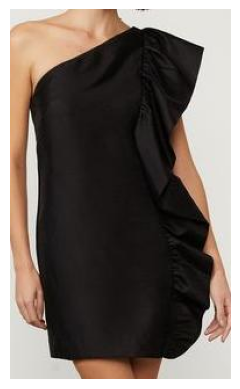

Similar: Brown color clothing - Distância: 49.59
Similar: Blue color clothing - Distância: 57.84
Similar: Pink color clothing - Distância: 58.33

Imagem: animale_images_cropped/calca/calca_calca-de-crepe-preta-com-sobreposicao-no-cos-e-cinto-forrado_preto_25-34-1509-0005.jpg


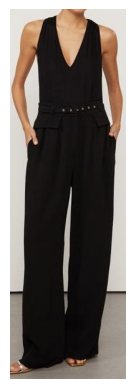

Similar: Brown color clothing - Distância: 46.46
Similar: Red color clothing - Distância: 58.48
Similar: Pink color clothing - Distância: 62.76

Imagem: animale_images_cropped/vestido/vestido_vestido-de-tricot-sem-alca-listrado-bicolor_preto---azul-cannes_07-20-6448-0005.jpg


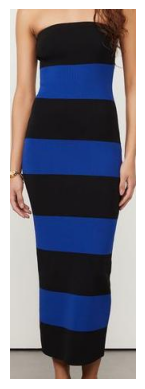

Similar: Brown color clothing - Distância: 47.73
Similar: Blue color clothing - Distância: 55.53
Similar: Yellow color clothing - Distância: 56.41

Imagem: animale_images_cropped/blusa/top-blusa_t-shirt-de-malha-com-decote-v_preto_52-06-0679-0005.jpg


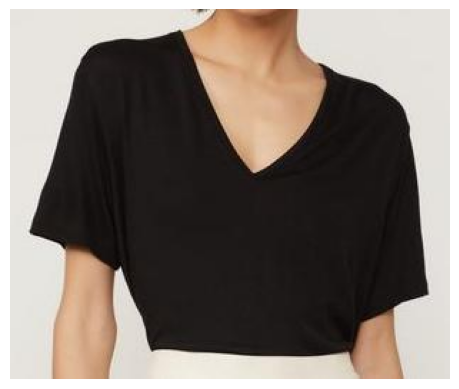

Similar: Brown color clothing - Distância: 46.25
Similar: Yellow color clothing - Distância: 58.01
Similar: Red color clothing - Distância: 61.04

Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-malha-manga-longa-com-decote-trapezio_preto_52-13-4820-0005.jpg


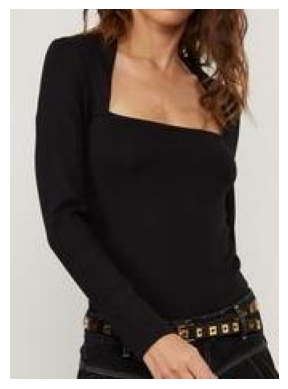

Similar: Brown color clothing - Distância: 48.74
Similar: Red color clothing - Distância: 56.21
Similar: Yellow color clothing - Distância: 59.47



In [162]:
# Pegando 5 amostras aleatórias de imagens para comparar
sample_indexes = random.sample(range(img_embs_lda.shape[0]), 5)
img_embs_lda_sample = img_embs_lda[sample_indexes]

files = df_base_categorizada.iloc[sample_indexes]['file_path'].values

similar_results = find_top_similar(
    embeddings_set1=img_embs_lda_sample,
    embeddings_set2=cores_embeddings_lda,
    n_top=3
)

for i, (indices, distances) in enumerate(similar_results):
    print(f"Imagem: {files[i]}")
    plot_image(files[i])  # Função para exibir a imagem
    for idx, dist in zip(indices, distances):  # Iterar sobre índice e distância simultaneamente
        description = description_list[idx]  
        print(f"Similar: {description} - Distância: {dist:.2f}")
    print()

animale_images_cropped/blusa/top-blusa_t-shirt-de-malha-estampada-com-decote-v_est-cobra-biscione-marzipan_52-06-0697-09538.jpg


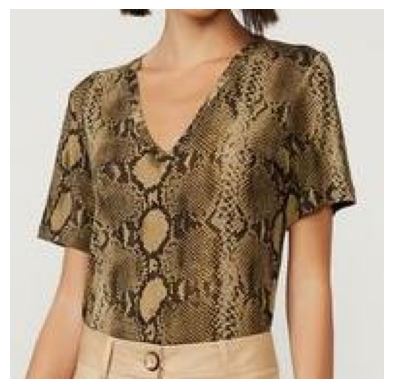

Brown color clothing 1.00
Black color clothing 0.99
White color clothing 0.99

animale_images_cropped/blusa/top-blusa_regata-de-malha-basic-decote-v-profundo_off-white_52-15-1406-0003.jpg


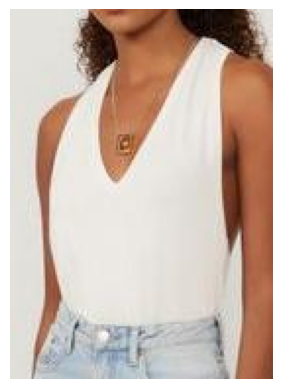

White color clothing 1.00
Brown color clothing 0.99
Black color clothing 0.99

animale_images_cropped/saia/saia_saia-longa-floral-aquarius-cura_est-floral-cura-aquarius-m_25-11-1434-09541.jpg


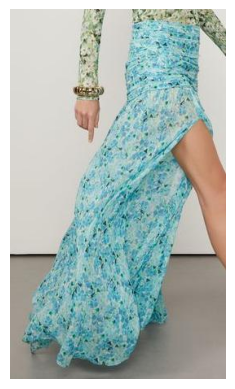

White color clothing 0.99
Brown color clothing 0.99
Black color clothing 0.99

animale_images_cropped/blusa/camisa_camisa-de-georgette-leve-polo-manga-curta-estampada_est-floral-garden-rum-e-vivo-m_52-05-1565-09544.jpg


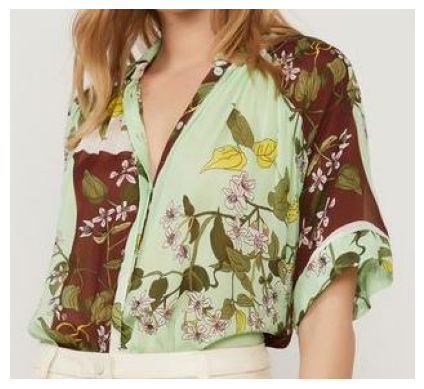

Brown color clothing 0.99
Green color clothing 0.99
Black color clothing 0.99

animale_images_cropped/saia/saia_saia-de-georgette-pesado-longa-franzida-estampada-frenda_est-onca-solsticio_25-11-1335-09905.jpg


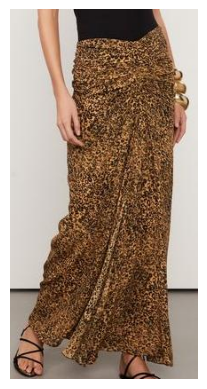

Brown color clothing 1.00
White color clothing 1.00
Black color clothing 1.00



In [ ]:
# # para cada dimensão do vetor de LDA das imagens, escalamos para bater com o mesmo min e max do vetor de cores
# for i in range(img_embs_lda.shape[1]):
#     min_value_color = cores_embeddings_lda[:, i].min()
#     max_value_color = cores_embeddings_lda[:, i].max()
#     min_value_img = img_embs_lda[:, i].min()
#     max_value_img = img_embs_lda[:, i].max()
#     img_embs_lda[:, i] = (img_embs_lda[:, i] - min_value_img) / (max_value_img - min_value_img) * (max_value_color - min_value_color) + min_value_color


# # Pegando 10 imagens aleatórias
# sample_indexes = random.sample(range(img_embs_lda.shape[0]), 5)
# img_embeddings_lda_sample = img_embs_lda[sample_indexes]
# files = df_base_categorizada['file_path'].values[sample_indexes]

# cos_sim = util.cos_sim(img_embeddings_lda_sample, cores_embeddings_lda)

# # # Voltando pra ndarray
# # cores_embeddings_lda = cores_embeddings_lda.numpy()
# # para cada imagem, vendo a semelhança com cada cor
# for file_name, scores in zip(files, cos_sim):
#   print(file_name)
#   plot_image(file_name)

#   # top 3 colors:
#   scores = scores.numpy()
#   top_3_indices = scores.argsort()
#   for i in range(3):
#     print(description_list[top_3_indices[-i-1]], f"{scores[top_3_indices[-i-1]]:.2f}")
#   print()

In [166]:
df_umap['COR_PREDOMINANTE'].nunique()

18

In [167]:
df_umap['COR_PREDOMINANTE'].value_counts()

PRETO            195
BEGE             111
AZUL              96
BRANCO            87
VERDE             73
AMARELO           36
LARANJA           32
ROSA              30
VERMELHO          29
OFF_WHITE         29
MULTICOLORIDO     13
ROXO              11
JEANS              8
MARROM             7
LILÁS              4
CINZA              3
VINHO              1
DOURADO            1
Name: COR_PREDOMINANTE, dtype: int64

In [168]:
df_umap

,id_produto,EMB_UMAP_0,EMB_UMAP_1,COR_PREDOMINANTE
0,03-04-0464-0030,-3.391729,-13.739964,BEGE
1,03-04-0478-6048,-2.986668,-13.824862,BEGE
2,03-04-0460-0003,-4.903277,-0.502893,BRANCO
3,03-04-0461-0005,8.220956,-8.154054,PRETO
4,03-04-0479-0024,-5.552527,0.126101,BRANCO
...,...,...,...,...
761,07-20-6778-0005,8.048409,-7.406993,PRETO
762,07-20-6402-09248,19.291971,0.353684,LARANJA
763,07-20-6401-0005,8.127141,-7.960863,PRETO
764,07-20-6659-09538,-3.725731,-13.790937,BEGE


ENCONTRANDO CENTROÍDES DOS CLUSTERS: pegar a média dos embeddings de cada COR_PREDOMINANTE para setar o centróide de cada cor.

In [169]:
df_lda.columns

Index(['id_produto', 'COR_PREDOMINANTE', 'EMB_LDA_0', 'EMB_LDA_1', 'EMB_LDA_2',
       'EMB_LDA_3', 'EMB_LDA_4', 'EMB_LDA_5', 'EMB_LDA_6', 'EMB_LDA_7',
       'EMB_LDA_8', 'EMB_LDA_9'],
      dtype='object')

In [170]:
from utils.functions import calcular_centroides

colunas_lda = [col for col in df_lda.columns if col.startswith('EMB_LDA')]

# Calcular os centróides de df_lda
df_centroides = calcular_centroides(df_lda, colunas_lda, 'COR_PREDOMINANTE')

In [89]:
# # 1. Calcular os centróides para cada COR_PREDOMINANTE
# df_centroides = df_lda.drop(columns={'id_produto'}).groupby('COR_PREDOMINANTE').mean().reset_index()

# # 2. Adicionar a coluna 'id_produto' aos centróides
# df_centroides['id_produto'] = df_centroides['COR_PREDOMINANTE'].apply(lambda x: f'CLUSTER_{x}')

# # 3. Adicionar uma coluna para identificar os centróides
# df_centroides['is_centroid'] = True
# df_lda['is_centroid'] = False  # Para os dados originais

# # 4. Concatenar os dados originais com os centróides
# df_combined = pd.concat([df_lda, df_centroides], ignore_index=True)

# # 5. Selecionar as colunas de embeddings
# colunas_lda = [col for col in df_lda.columns if col.startswith('EMB_LDA')]

# # 6. Aplicar UMAP para reduzir a dimensionalidade para 2D
# umap_model = UMAP(n_components=2, random_state=42)
# umap_result = umap_model.fit_transform(df_combined[colunas_lda])

# # 7. Adicionar os resultados do UMAP ao dataframe combinado
# df_combined['UMAP_1'] = umap_result[:, 0]
# df_combined['UMAP_2'] = umap_result[:, 1]

# # 8. Separar os dados originais dos centróides
# df_original = df_combined[df_combined['is_centroid'] == False]
# df_centroids = df_combined[df_combined['is_centroid'] == True]

# # 9. Definir um dicionário de cores para as categorias
# # Certifique-se de que todas as categorias em 'COR_PREDOMINANTE' tenham uma cor definida
# categorias = df_original['COR_PREDOMINANTE'].unique()
# cmap = plt.get_cmap('tab10')  # Escolha um mapa de cores adequado
# # Dicionário de cores ajustado para cada valor de COR_PREDOMINANTE
# color_dict = {
#     'PRETO': '#000000',           # Preto puro
#     'AZUL': '#1f77b4',            # Azul padrão
#     'MULTICOLORIDO': '#808080',    # Cinza (para representar múltiplas cores de forma neutra)
#     'VERDE': '#2ca02c',           # Verde padrão
#     'ROSA': '#ff69b4',            # Rosa vibrante
#     'BEGE': '#D2B48C',            # Bege suave
#     'AMARELO': '#ffdd57',         # Amarelo claro
#     'VERMELHO': '#d62728',        # Vermelho escuro
#     'LARANJA': '#ff7f0e',         # Laranja padrão
#     'ROXO': '#9467bd',            # Roxo médio
#     'BRANCO': '#FFFFFF',          # Branco puro
#     'MARROM': '#8B4513',          # Marrom escuro
#     'CINZA': '#808080',           # Cinza médio
# }
# # 10. Plotar os dados
# plt.figure(figsize=(12, 8))

# # Plotar os dados originais
# for categoria, cor in color_dict.items():
#     subset = df_original[df_original['COR_PREDOMINANTE'] == categoria]
#     plt.scatter(subset['UMAP_1'], subset['UMAP_2'],
#                 c=[cor],
#                 label=categoria,
#                 alpha=0.6,
#                 edgecolor='k',
#                 s=50)

# # Plotar os centróides com marcador 'X'
# plt.scatter(df_centroids['UMAP_1'], df_centroids['UMAP_2'],
#             marker='x',
#             s=100,
#             c='yellow',
#             linewidths=2,
#             label='Centróides')

# plt.title('Visualização de Clusters com Centrôides (UMAP)')
# plt.xlabel('UMAP 1')
# plt.ylabel('UMAP 2')
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.grid(True)
# plt.show()


In [172]:
from utils.functions import plot_clusters_with_centroids

# Gerar o gráfico com UMAP
fig = plot_clusters_with_centroids(
    df_combined=df_centroides,
    target_column='COR_PREDOMINANTE',
    embedding_columns=colunas_lda,
    color_dict=color_dict,  # Opcional, pode ser None
    title="Visualização de Clusters com Centróides (LDA + UMAP)",
)

# Mostrar o gráfico
fig.show()

c:\Users\Cole\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [173]:
df_centroides

,id_produto,COR_PREDOMINANTE,EMB_LDA_0,EMB_LDA_1,EMB_LDA_2,EMB_LDA_3,EMB_LDA_4,EMB_LDA_5,EMB_LDA_6,EMB_LDA_7,EMB_LDA_8,EMB_LDA_9,is_centroid,UMAP_0,UMAP_1
0,03-04-0464-0030,BEGE,-4.612493,-3.678349,1.728147,-2.441147,-1.052707,-0.023659,-1.796217,3.090048,-3.601199,1.162242,False,10.023043,-9.389030
1,03-04-0478-6048,BEGE,-4.693364,-4.006449,1.871645,-3.504627,-2.072891,0.598166,0.116953,-0.096825,-3.521633,0.357464,False,10.934052,-9.047745
2,03-04-0460-0003,BRANCO,-2.538794,-1.575228,5.117051,-2.339249,4.911545,-0.505520,-0.095888,0.062169,3.650489,-0.554855,False,4.932327,2.116434
3,03-04-0461-0005,PRETO,8.600836,-2.577406,-1.403589,0.417611,-0.607053,-1.039741,0.848860,0.373758,-1.044476,-0.783608,False,-4.552746,-6.219331
4,03-04-0479-0024,BRANCO,-4.017709,0.025236,6.253312,-4.743942,6.561825,-1.887124,1.136675,0.961716,2.296356,0.818656,False,4.139639,1.862446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
774,CLUSTER_PRETO,PRETO,9.193958,-2.376865,-0.419368,-0.159068,-0.618658,0.115263,-0.113284,-0.006858,-0.041117,0.088414,True,-4.577602,-6.574176
775,CLUSTER_ROSA,ROSA,-5.546884,-6.886937,-5.779180,6.218138,3.121777,-2.931663,-0.267364,-1.669021,-0.808780,-8.481403,True,22.217340,-2.380866
776,CLUSTER_ROXO,ROXO,-2.675736,1.912148,-5.004065,9.123550,3.627379,12.800672,3.533874,9.682811,1.247391,-0.804352,True,3.825995,24.382446
777,CLUSTER_VERDE,VERDE,-0.580830,9.190647,-7.961219,-5.391308,0.327049,-0.559683,-0.536218,-0.237919,0.381218,-0.572909,True,12.596341,7.586683


Imagem: animale_images_cropped/blusa/top-blusa_blusa-decote-v-e-manga-longa-raglan-de-malha_verde-encanto_52-13-5461-09253.jpg


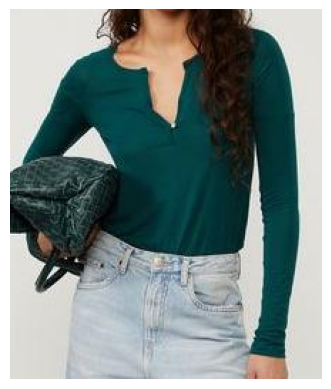

Centroide: CLUSTER_VERDE - Score: 2.75
Centroide: CLUSTER_BRANCO - Score: 15.65
Centroide: CLUSTER_CINZA - Score: 15.87
Imagem: animale_images_cropped/blusa/top-blusa_regata-telada_bege-gengibre_52-15-1363-6205.jpg


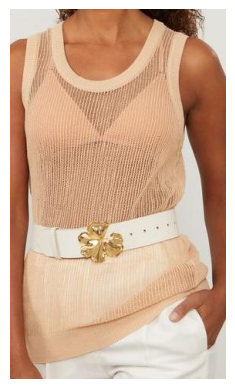

Centroide: CLUSTER_BEGE - Score: 2.46
Centroide: CLUSTER_BRANCO - Score: 11.96
Centroide: CLUSTER_MARROM - Score: 12.49
Imagem: animale_images_cropped/blusa/top-blusa_blusa-com-nervuras-na-manga_off-white_52-13-5352-0024.jpg


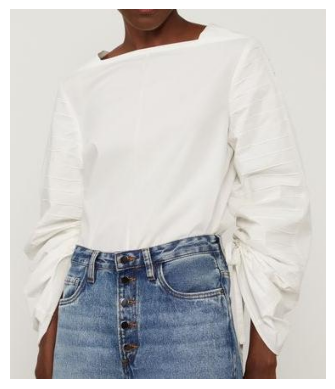

Centroide: CLUSTER_BRANCO - Score: 2.64
Centroide: CLUSTER_BEGE - Score: 9.14
Centroide: CLUSTER_CINZA - Score: 11.12
Imagem: animale_images_cropped/blusa/camisa_camisa-alongada_dourado_52-05-1511-1419.jpg


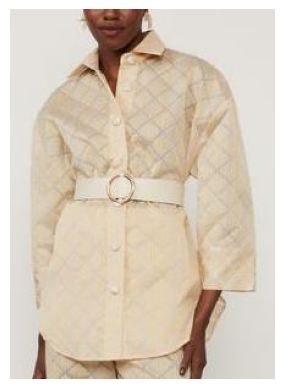

Centroide: CLUSTER_BEGE - Score: 3.79
Centroide: CLUSTER_BRANCO - Score: 12.85
Centroide: CLUSTER_MARROM - Score: 13.84
Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-tricot-com-manga-longa-e-decote-redondo-color-lilas_lilas-nuvem_52-13-4927-09040.jpg


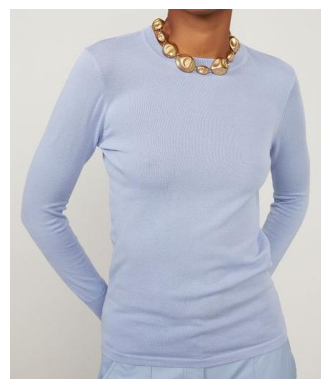

Centroide: CLUSTER_AZUL - Score: 2.21
Centroide: CLUSTER_CINZA - Score: 13.14
Centroide: CLUSTER_BRANCO - Score: 15.03
Imagem: animale_images_cropped/blusa/top-blusa_blusa-manga-longa-com-babado-no-decote_off-white_52-13-5365-0024.jpg


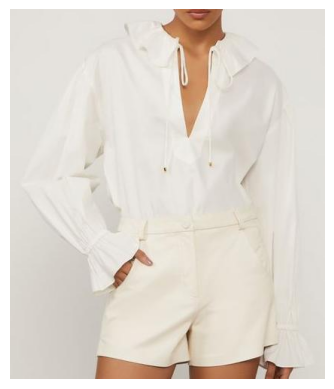

Centroide: CLUSTER_BRANCO - Score: 2.16
Centroide: CLUSTER_CINZA - Score: 11.27
Centroide: CLUSTER_BEGE - Score: 12.05
Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-tricot-com-manga-longa-e-decote-redondo-color-preto_preto_52-13-5009-0005.jpg


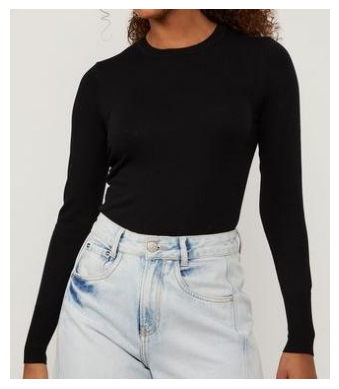

Centroide: CLUSTER_PRETO - Score: 2.11
Centroide: CLUSTER_CINZA - Score: 8.86
Centroide: CLUSTER_BRANCO - Score: 14.02
Imagem: animale_images_cropped/vestido/vestido_vestido-de-malha-midi-estampado-com-franzido-na-saia_est-geo-caminho-preto-e-kirli_07-20-6652-09601.jpg


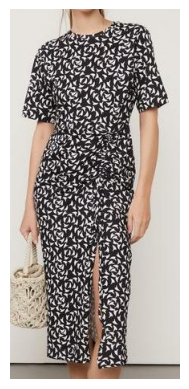

Centroide: CLUSTER_PRETO - Score: 3.92
Centroide: CLUSTER_CINZA - Score: 7.83
Centroide: CLUSTER_BRANCO - Score: 13.12
Imagem: animale_images_cropped/vestido/vestido_vestido-de-georgette-leve-decote-v-estampado-pala-franzida_est-cobra-biscione-natureza_07-20-6611-09539.jpg


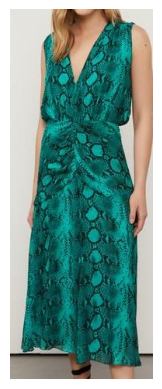

Centroide: CLUSTER_VERDE - Score: 3.73
Centroide: CLUSTER_CINZA - Score: 14.34
Centroide: CLUSTER_AZUL - Score: 14.79
Imagem: animale_images_cropped/blazer/blazer_blazer-alongado-marrom-nozes-sem-lapela_marrom-nozes_03-04-0478-6048.jpg


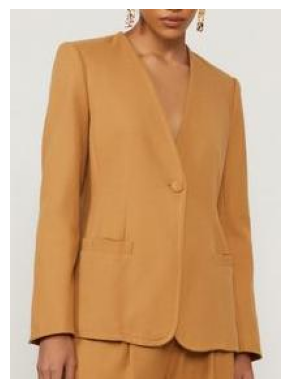

Centroide: CLUSTER_BEGE - Score: 3.89
Centroide: CLUSTER_BRANCO - Score: 10.69
Centroide: CLUSTER_AMARELO - Score: 12.03
Imagem: animale_images_cropped/blusa/top-blusa_t-shirt-de-tricot-verde-basico-com-gola-alta_verde-encanto_52-06-0655-09253.jpg


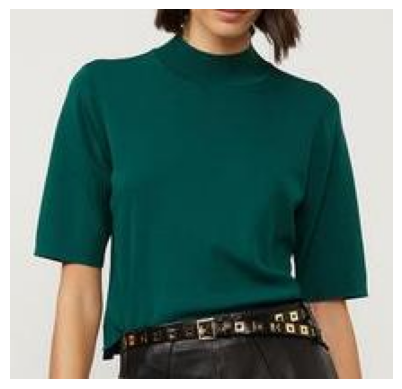

Centroide: CLUSTER_VERDE - Score: 3.11
Centroide: CLUSTER_CINZA - Score: 15.46
Centroide: CLUSTER_BEGE - Score: 16.03
Imagem: animale_images_cropped/calca/calca_calca-jeans-nipper-basic_jeans-medio_25-34-1798-0105.jpg


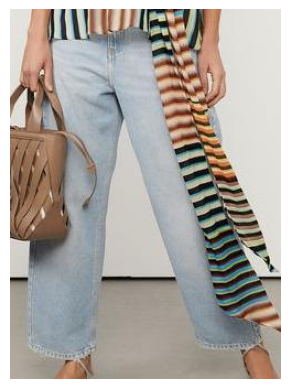

Centroide: CLUSTER_AZUL - Score: 2.77
Centroide: CLUSTER_CINZA - Score: 11.51
Centroide: CLUSTER_BRANCO - Score: 13.39
Imagem: animale_images_cropped/saia/saia_saia-de-linho-midi-bicolor_bege-kirli_25-11-1198-03023.jpg


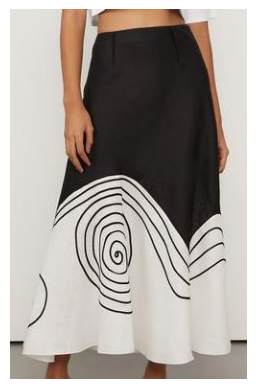

Centroide: CLUSTER_PRETO - Score: 2.75
Centroide: CLUSTER_CINZA - Score: 9.67
Centroide: CLUSTER_BRANCO - Score: 15.04
Imagem: animale_images_cropped/blusa/top-blusa_top-de-couro-alca-fininha_preto_52-10-5186-0005.jpg


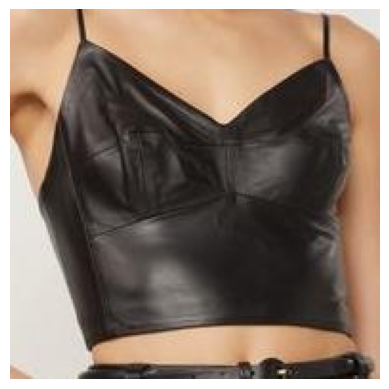

Centroide: CLUSTER_PRETO - Score: 3.01
Centroide: CLUSTER_CINZA - Score: 10.07
Centroide: CLUSTER_BEGE - Score: 15.50
Imagem: animale_images_cropped/vestido/vestido_vestido-de-couro-midi-alca-recortes_preto_07-20-6200-0005.jpg


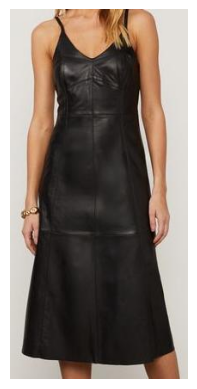

Centroide: CLUSTER_PRETO - Score: 4.82
Centroide: CLUSTER_CINZA - Score: 9.29
Centroide: CLUSTER_BRANCO - Score: 16.60
Imagem: animale_images_cropped/vestido/vestido_vestido-de-georgette-midi-com-frente-unica-estampado_est-onca-leve-flan_07-20-6857-09845.jpg


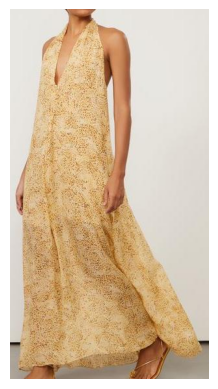

Centroide: CLUSTER_AMARELO - Score: 5.86
Centroide: CLUSTER_BEGE - Score: 10.23
Centroide: CLUSTER_BRANCO - Score: 15.83
Imagem: animale_images_cropped/blusa/top-blusa_regata-de-malha-rib-com-decote-u_preto_52-15-1409-0005.jpg


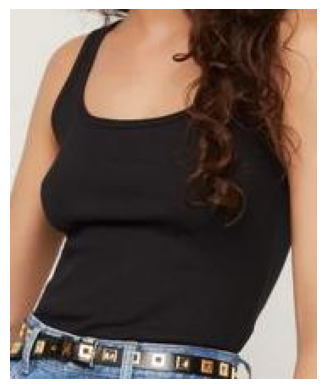

Centroide: CLUSTER_PRETO - Score: 2.03
Centroide: CLUSTER_CINZA - Score: 9.69
Centroide: CLUSTER_BRANCO - Score: 14.70
Imagem: animale_images_cropped/blazer/blazer_colete-bege-gergelim_bege-gergelim_03-06-0331-09247.jpg


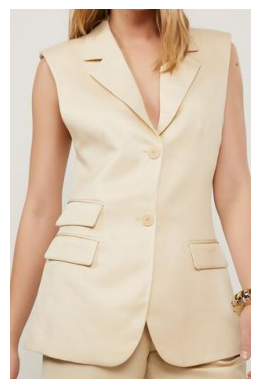

Centroide: CLUSTER_BEGE - Score: 3.09
Centroide: CLUSTER_BRANCO - Score: 10.80
Centroide: CLUSTER_MARROM - Score: 13.05
Imagem: animale_images_cropped/vestido/vestido_vestido-midi-lenco-devore-abstrato_off-white_07-20-6533-0003.jpg


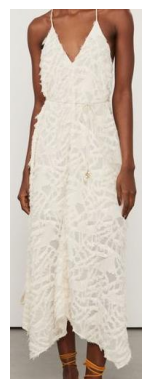

Centroide: CLUSTER_BRANCO - Score: 3.42
Centroide: CLUSTER_BEGE - Score: 10.01
Centroide: CLUSTER_CINZA - Score: 10.95
Imagem: animale_images_cropped/blusa/top-blusa_tunica-laise-de-algodao-rose-gold_rose-gold_52-05-1558-5471.jpg


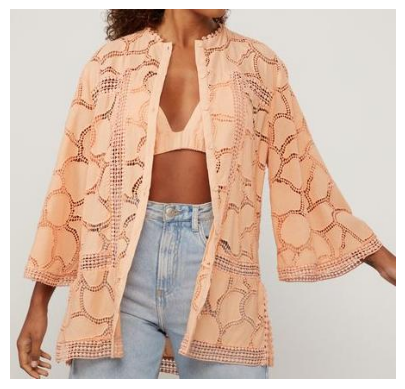

Centroide: CLUSTER_BEGE - Score: 3.97
Centroide: CLUSTER_MARROM - Score: 12.36
Centroide: CLUSTER_BRANCO - Score: 12.64
Imagem: animale_images_cropped/blusa/top-blusa_blusa-de-tricot-verde-com-amarracao-nas-costas_verde-folha_52-13-5353-09258.jpg


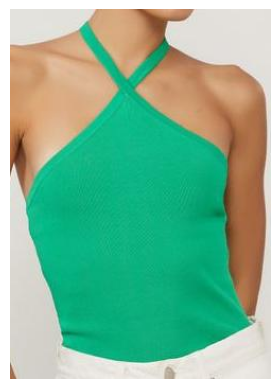

Centroide: CLUSTER_VERDE - Score: 1.45
Centroide: CLUSTER_CINZA - Score: 17.32
Centroide: CLUSTER_BRANCO - Score: 17.64
Imagem: animale_images_cropped/calca/calca_calca-detalhe-amarracao-na-barra-rosa_rosa-shocking_25-34-2006-09283.jpg


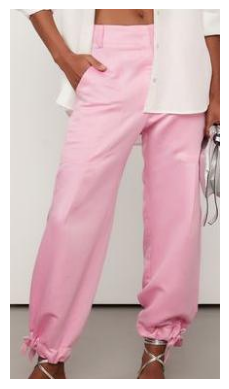

Centroide: CLUSTER_ROSA - Score: 4.32
Centroide: CLUSTER_CINZA - Score: 16.50
Centroide: CLUSTER_BEGE - Score: 19.90
Imagem: animale_images_cropped/calca/calca_calca-de-tricot-maxi-canelado_verde-summer_25-34-1928-04113.jpg


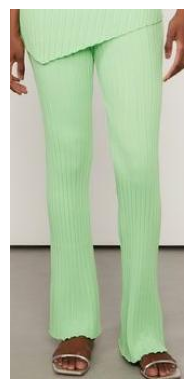

Centroide: CLUSTER_VERDE - Score: 2.11
Centroide: CLUSTER_CINZA - Score: 16.53
Centroide: CLUSTER_BRANCO - Score: 17.41
Imagem: animale_images_cropped/calca/calca_calca-reta-piquet-de-algodao-preta_preto_25-34-2013-0005.jpg


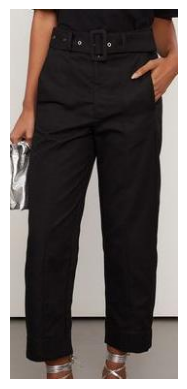

Centroide: CLUSTER_PRETO - Score: 2.40
Centroide: CLUSTER_CINZA - Score: 10.36
Centroide: CLUSTER_BRANCO - Score: 15.13
Imagem: animale_images_cropped/blusa/top-blusa_blusa-sem-alca_off-white_52-13-5411-0024.jpg


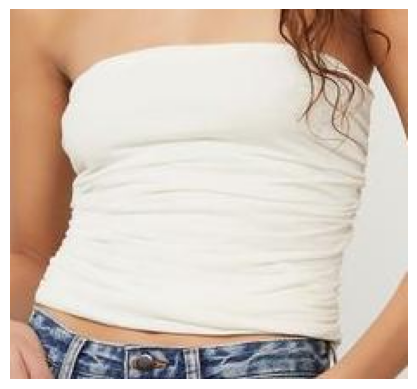

Centroide: CLUSTER_BRANCO - Score: 2.02
Centroide: CLUSTER_BEGE - Score: 11.49
Centroide: CLUSTER_CINZA - Score: 12.63
Imagem: animale_images_cropped/calca/calca_calca-de-georgette-estampado_est-pois-ciclos-golden-e-musgo_25-34-2086-09817.jpg


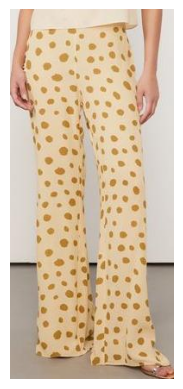

Centroide: CLUSTER_BEGE - Score: 2.93
Centroide: CLUSTER_BRANCO - Score: 12.46
Centroide: CLUSTER_MARROM - Score: 14.10
Imagem: animale_images_cropped/blusa/top-blusa_blusa-kimono-com-manga-longa-de-renda-az_azul-blue_52-13-5316-09244.jpg


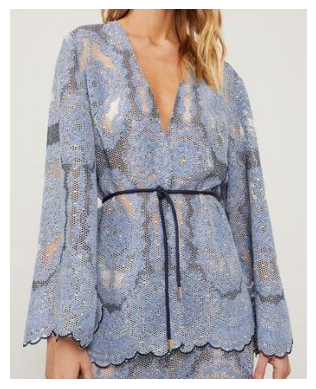

Centroide: CLUSTER_AZUL - Score: 2.29
Centroide: CLUSTER_CINZA - Score: 12.40
Centroide: CLUSTER_BRANCO - Score: 14.51
Imagem: animale_images_cropped/vestido/vestido_vestido-de-tricot-vermelho-com-decote-quadrado_vermelho-fiery_07-20-6451-8259.jpg


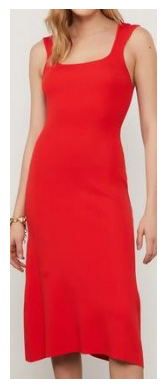

Centroide: CLUSTER_VERMELHO - Score: 1.89
Centroide: CLUSTER_ROSA - Score: 16.91
Centroide: CLUSTER_MARROM - Score: 17.84
Imagem: animale_images_cropped/vestido/vestido_vestido-longo-com-amarracao-no-busto_est--lenco-pois-recote-g_07-20-6382-09607.jpg


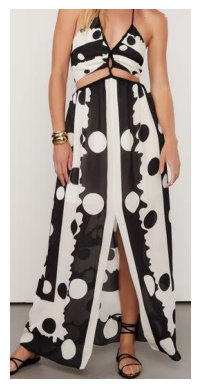

Centroide: CLUSTER_PRETO - Score: 3.82
Centroide: CLUSTER_CINZA - Score: 8.49
Centroide: CLUSTER_BRANCO - Score: 11.54
Imagem: animale_images_cropped/blusa/top-blusa_blusa-vazada-de-tricot-verde-simply_verde-simply_52-13-5367-03344.jpg


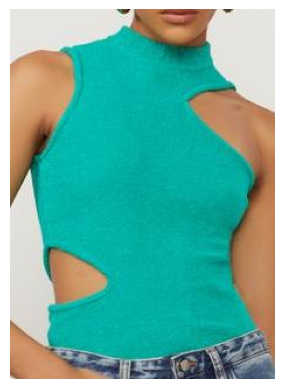

Centroide: CLUSTER_VERDE - Score: 2.65
Centroide: CLUSTER_CINZA - Score: 15.96
Centroide: CLUSTER_AZUL - Score: 16.98


In [174]:
# Pegando 10 imagens aleatórias
img_embs_lda = df_lda[colunas_lda].values
sample_indexes = random.sample(range(img_embs_lda.shape[0]), 30)
img_embeddings_lda_sample = img_embs_lda[sample_indexes]
files = df_base_categorizada['file_path'].values[sample_indexes]

# Filtrando df_centroides pra pegar só os centroides
df_centroides_filtrado = df_centroides[df_centroides['is_centroid'] == True]
centroides = df_centroides_filtrado[colunas_lda].values
centroides = torch.tensor(centroides, dtype=torch.float32)

# cos_sim = util.cos_sim(img_embeddings_lda_sample, df_centroides[colunas_lda].values)

img_embeddings_lda_sample = torch.tensor(img_embeddings_lda_sample, dtype=torch.float32)

euclidean_dist = torch.cdist(img_embeddings_lda_sample, centroides, p=2)

# para cada imagem, vendo a semelhança com top 3 centroides mais próximos 
for i, distances in enumerate(euclidean_dist):
    print(f"Imagem: {files[i]}")
    plot_image(files[i])  # Função para exibir a imagem
    
    # Convertendo distances para NumPy, se necessário
    if isinstance(distances, torch.Tensor):
        distances = distances.cpu().numpy()
    
    # Obtendo os 3 índices com menor distância
    top_3_indices = distances.argsort()[:3]
    
    # Para cada imagem, vendo a semelhança com cada centroide mais próximo
    for idx in top_3_indices:
        # Pegando o nome do centroide e a distancia da imagem pra ele
        centroid_name = df_centroides_filtrado.iloc[idx]['id_produto']
        similar_score = distances[idx]
        print(f"Centroide: {centroid_name} - Score: {similar_score:.2f}")

# # para cada imagem, vendo a semelhança com cada cor
# for file_name, scores in zip(files, cos_sim):
#   print(file_name)
#   plot_image(file_name)

#   # top 3 colors:
#   scores = scores.numpy()
#   top_3_indices = scores.argsort()
#   for i in range(3):
#     print(df_centroides.iloc[top_3_indices[-i-1]]['COR_PREDOMINANTE'], f"{scores[top_3_indices[-i-1]]:.2f}")
# print()

Muuuito melhor com 10 dimensões! Conseguimos ver uma separação mais clara das cores.\

O modelo está dando conta de classificar a cor do produto corretamente apenas olhando pro embedding da imagem.

## Testando busca

In [233]:
# Gerando os embeddings das imagens teste
pasta = "teste_images_cor"

# Criando lista com as image_paths da pasta
image_paths = [os.path.join(pasta, path).replace('\\','/') for path in os.listdir(pasta)]

# Criando um df_color com os nomes das imagens
df_teste = pd.DataFrame(image_paths, columns=["image_path"])


In [234]:
# Now we load and encode the images
def load_image(url_or_path):
    if url_or_path.startswith("http://") or url_or_path.startswith("https://"):
        return Image.open(requests.get(url_or_path, stream=True).raw)
    else:
        return Image.open(url_or_path)

file_names = df_teste['image_path'].values
images = [load_image(img) for img in file_names]
img_embeddings = img_model.encode(images)

img_embeddings

array([[ 0.02259515, -0.09865645, -0.0290992 , ...,  0.7115479 ,
        -0.41434473,  0.56446445],
       [-0.06295233,  0.01890525, -0.12194834, ...,  0.15583399,
        -0.168661  ,  0.58694273],
       [-0.2468163 ,  0.23940614, -0.3174309 , ...,  0.594273  ,
        -0.43305337,  0.13149756],
       ...,
       [ 0.12463398, -0.3037274 , -0.02213591, ...,  0.55207616,
         0.06693589,  0.34842932],
       [ 0.31417406, -0.238452  , -0.05673251, ...,  0.04833928,
        -0.21209984,  0.50992846],
       [ 0.08402456, -0.07418055, -0.13874753, ...,  0.40317976,
        -0.05153633,  0.10584958]], dtype=float32)

In [235]:
# Adicionando embeddings em df_teste
emb_dict = {}

for i, emb in enumerate(img_embeddings):
    emb_id = df_teste.iloc[i]["image_path"]
    emb_dict[emb_id] = emb

df_teste_embs = pd.DataFrame(emb_dict).T

# Renomeando as colunas de embedding para emb_i
df_teste_embs.columns = [f'emb_img_{i}' for i in range(df_teste_embs.shape[1])]


In [236]:
lda_model


LinearDiscriminantAnalysis(n_components=10)

In [237]:
df_teste_embs

,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,emb_img_9,...,emb_img_502,emb_img_503,emb_img_504,emb_img_505,emb_img_506,emb_img_507,emb_img_508,emb_img_509,emb_img_510,emb_img_511
teste_images_cor/VESTIDO_AZUL.png,0.022595,-0.098656,-0.029099,0.567702,-0.562149,0.065461,-0.195253,-0.300731,0.367395,0.107400,...,0.067679,-0.377808,-0.037915,-0.205793,0.097149,-0.060826,0.037285,0.711548,-0.414345,0.564464
teste_images_cor/VESTIDO_CIANO.png,-0.062952,0.018905,-0.121948,0.007386,-0.161697,0.111981,-0.268656,0.237585,0.651879,-0.275347,...,0.219109,-0.208903,0.505170,-0.054623,0.023165,0.211817,0.141975,0.155834,-0.168661,0.586943
teste_images_cor/VESTIDO_LISTRADO.png,-0.246816,0.239406,-0.317431,0.397968,-0.143012,0.335053,0.085922,0.136599,0.506718,-0.036190,...,0.216211,-0.094713,0.319507,-0.469476,0.193140,0.003130,-0.171389,0.594273,-0.433053,0.131498
teste_images_cor/VESTIDO_MARROM.png,0.137735,0.187964,-0.030165,0.146878,-0.452270,0.270015,-0.183899,0.258470,0.667568,0.012360,...,0.112846,-0.226068,0.513181,-0.111401,0.008002,0.311027,0.055253,0.552292,-0.168289,0.206410
teste_images_cor/VESTIDO_MARROM_2.png,-0.291701,-0.018742,-0.069712,0.075746,-0.119037,0.126561,-0.144355,-0.246068,0.475600,0.022687,...,0.007640,-0.197631,0.584562,-0.074490,0.133096,-0.156897,0.230855,0.756065,-0.477595,0.192697
teste_images_cor/VESTIDO_ROXO.png,0.124634,-0.303727,-0.022136,0.342569,-0.422898,0.121094,-0.266027,0.140250,0.904812,-0.045872,...,0.021772,-0.041850,0.121323,-0.118815,0.038153,-0.024812,0.233595,0.552076,0.066936,0.348429
teste_images_cor/VESTIDO_VERDE.png,0.314174,-0.238452,-0.056733,0.088339,-0.422520,0.088575,0.144455,0.415287,0.372337,-0.214220,...,0.199320,-0.111156,0.449900,0.199686,0.187086,-0.536322,0.078007,0.048339,-0.212100,0.509928
teste_images_cor/VESTIDO_VERMELHO.png,0.084025,-0.074181,-0.138748,0.342731,-0.131960,0.477358,-0.196876,0.270788,0.580135,-0.107066,...,0.097421,-0.385517,-0.025575,-0.008097,-0.044830,-0.019088,0.096439,0.403180,-0.051536,0.105850


In [238]:
colunas_embs = [col for col in df_teste_embs.columns if 'emb_img' in col]

In [239]:
df_teste_embs.reset_index(inplace=True)

In [240]:
# Renomear index para id_produto
df_teste_embs.rename(columns={'index': 'id_produto'}, inplace=True)

In [241]:
# Aplicando mesmo LDA usado no treinamento
img_embs_teste_lda, lda_model = apply_lda(df_teste_embs, colunas_embs, 10, lda=lda_model)

In [242]:
img_embs_teste_lda

,id_produto,EMB_LDA_0,EMB_LDA_1,EMB_LDA_2,EMB_LDA_3,EMB_LDA_4,EMB_LDA_5,EMB_LDA_6,EMB_LDA_7,EMB_LDA_8,EMB_LDA_9
0,teste_images_cor/VESTIDO_AZUL.png,1.206949,4.200676,12.312710,2.746724,-7.894183,-0.533214,-3.169938,0.784738,-2.177790,9.194766
1,teste_images_cor/VESTIDO_CIANO.png,-0.842599,5.429700,-2.473902,-4.311557,-0.378812,-1.700449,-0.083903,-1.509285,-3.654183,-4.954763
2,teste_images_cor/VESTIDO_LISTRADO.png,7.643853,-4.840489,3.673870,-1.792219,3.326326,0.566991,-2.529860,-7.168198,4.006506,-2.837919
3,teste_images_cor/VESTIDO_MARROM.png,-0.873111,1.534213,-5.291064,3.914009,3.313704,-2.301411,4.658180,3.286316,-0.623360,0.871365
4,teste_images_cor/VESTIDO_MARROM_2.png,-4.891588,4.162827,-4.535796,-0.414617,1.155607,0.263764,7.112087,-2.305465,1.527069,10.188649
5,teste_images_cor/VESTIDO_ROXO.png,0.115062,7.303106,-4.426639,11.985817,0.922451,7.223935,4.753663,8.727475,1.152862,7.356528
6,teste_images_cor/VESTIDO_VERDE.png,5.117183,15.896765,-11.282075,3.128803,11.231863,-5.557952,-2.009484,-0.734458,-10.080219,0.931676
7,teste_images_cor/VESTIDO_VERMELHO.png,-0.754376,0.462047,-9.551081,7.555394,6.486330,-1.243521,-9.180934,-1.290593,3.670233,2.983793


In [243]:
img_embs_lda = df_lda[colunas_lda]
img_embs_lda

,EMB_LDA_0,EMB_LDA_1,EMB_LDA_2,EMB_LDA_3,EMB_LDA_4,EMB_LDA_5,EMB_LDA_6,EMB_LDA_7,EMB_LDA_8,EMB_LDA_9
0,-4.612493,-3.678349,1.728147,-2.441147,-1.052707,-0.023659,-1.796217,3.090048,-3.601199,1.162242
1,-4.693364,-4.006449,1.871645,-3.504627,-2.072891,0.598166,0.116953,-0.096825,-3.521633,0.357464
2,-2.538794,-1.575228,5.117051,-2.339249,4.911545,-0.505520,-0.095888,0.062169,3.650489,-0.554855
3,8.600836,-2.577406,-1.403589,0.417611,-0.607053,-1.039741,0.848860,0.373758,-1.044476,-0.783608
4,-4.017709,0.025236,6.253312,-4.743942,6.561825,-1.887124,1.136675,0.961716,2.296356,0.818656
...,...,...,...,...,...,...,...,...,...,...
761,9.928578,-4.234313,-1.150511,-0.932721,-0.596168,-1.567239,-1.486827,-0.427811,-0.208780,1.349933
762,-5.895268,-4.017624,-2.132404,0.733570,-7.876887,-3.364087,5.762025,0.900114,4.678587,1.025169
763,10.895196,-3.914337,-1.381806,0.085476,-0.584896,-0.252824,0.759549,0.802670,-1.885584,0.088204
764,-4.362687,-2.289843,1.427536,-3.248834,-0.726196,-2.025339,-2.443264,2.217101,-4.184645,-1.213252


In [244]:
img_embs_teste_lda[colunas_lda].values

array([[  1.20694936,   4.2006764 ,  12.31270951,   2.74672439,
         -7.89418264,  -0.53321354,  -3.16993767,   0.78473827,
         -2.17778987,   9.19476604],
       [ -0.84259913,   5.42969975,  -2.47390232,  -4.3115566 ,
         -0.37881238,  -1.70044894,  -0.08390259,  -1.50928501,
         -3.65418296,  -4.95476348],
       [  7.64385324,  -4.84048886,   3.67387027,  -1.79221864,
          3.32632578,   0.56699088,  -2.52986024,  -7.16819793,
          4.00650575,  -2.83791938],
       [ -0.87311107,   1.53421264,  -5.29106433,   3.91400886,
          3.31370397,  -2.30141064,   4.65818014,   3.28631569,
         -0.62335987,   0.87136456],
       [ -4.89158824,   4.16282729,  -4.53579647,  -0.41461736,
          1.15560716,   0.26376427,   7.11208658,  -2.30546468,
          1.52706895,  10.18864878],
       [  0.115062  ,   7.30310567,  -4.42663896,  11.98581653,
          0.92245117,   7.2239352 ,   4.75366309,   8.72747531,
          1.15286211,   7.3565282 ],
       [  

Imagem de Teste: teste_images_cor/VESTIDO_AZUL.png


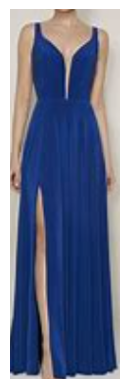

Similaridade: 52-05-1637-04331 - Score: 12.63


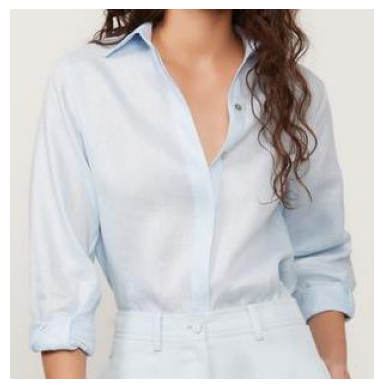

Similaridade: 25-11-1280-0105 - Score: 12.65


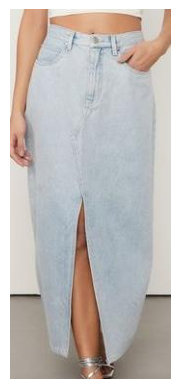

Similaridade: 07-20-6571-09244 - Score: 12.68


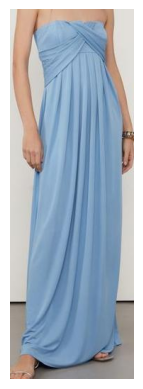


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_CIANO.png


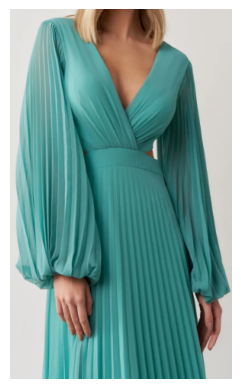

Similaridade: 07-20-6414-09542 - Score: 7.42


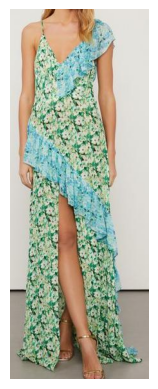

Similaridade: 07-20-6347-09538 - Score: 7.59


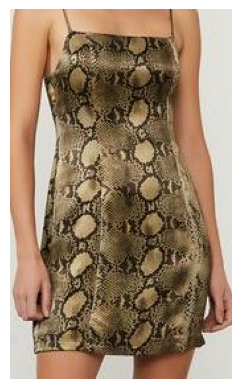

Similaridade: 03-06-0340-09254 - Score: 7.65


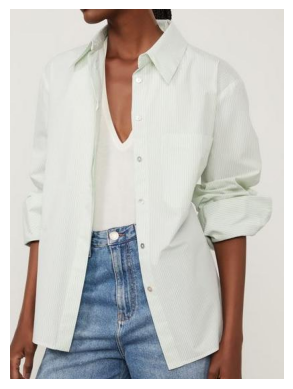


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_LISTRADO.png


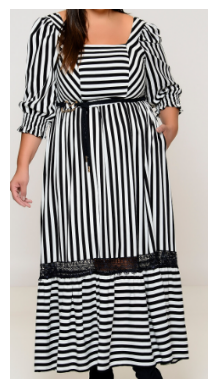

Similaridade: 52-13-5557-0005 - Score: 8.77


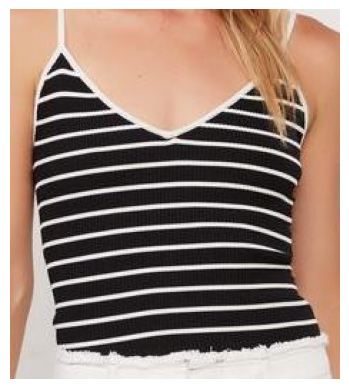

Similaridade: 25-34-1202-0005 - Score: 8.93


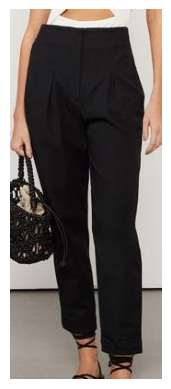

Similaridade: 52-10-5147-0005 - Score: 9.22


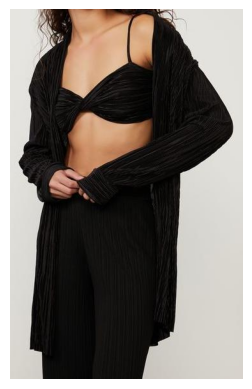


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_MARROM.png


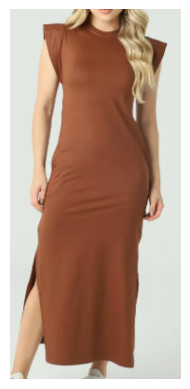

Similaridade: 52-13-4926-0015 - Score: 10.83


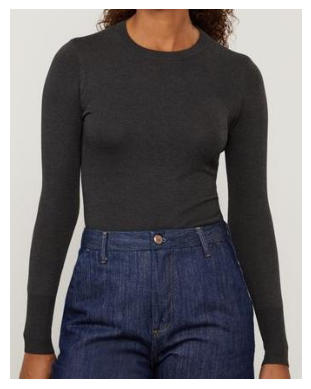

Similaridade: 25-34-2016-09281 - Score: 10.91


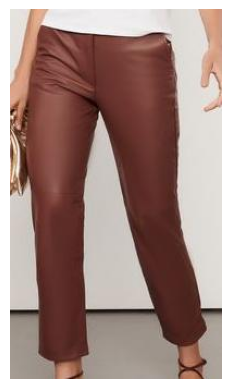

Similaridade: 52-15-1507-1407 - Score: 11.16


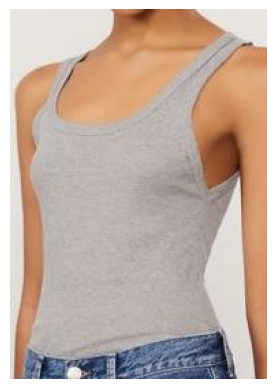


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_MARROM_2.png


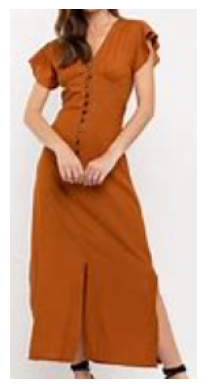

Similaridade: 07-20-6355-09253 - Score: 12.42


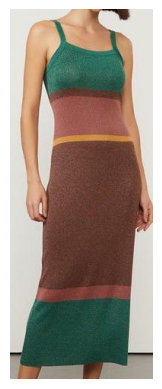

Similaridade: 25-11-1264-09260 - Score: 14.05


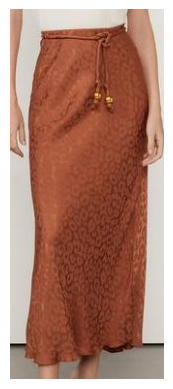

Similaridade: 52-15-1408-09249 - Score: 14.13


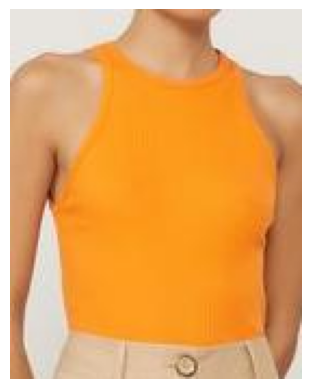


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_ROXO.png


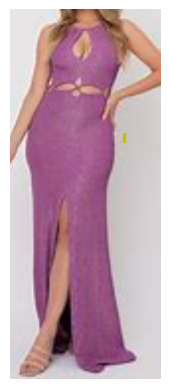

Similaridade: 25-34-2037-09281 - Score: 10.51


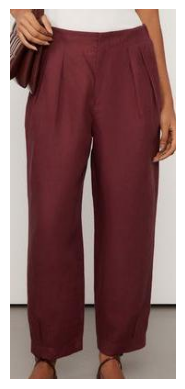

Similaridade: 07-20-6484-09561 - Score: 11.12


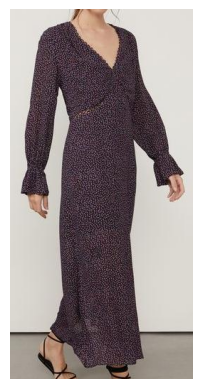

Similaridade: 52-15-1381-09252 - Score: 11.25


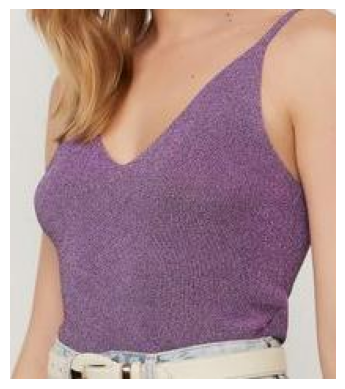


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_VERDE.png


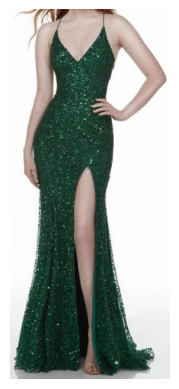

Similaridade: 25-34-1723-09253 - Score: 18.38


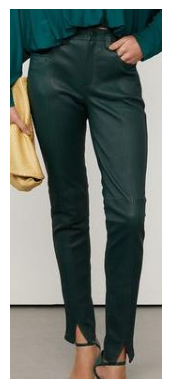

Similaridade: 52-15-1376-09255 - Score: 18.48


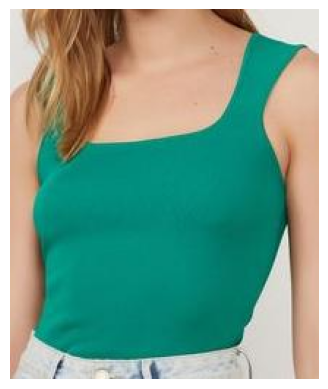

Similaridade: 07-20-6601-09253 - Score: 18.59


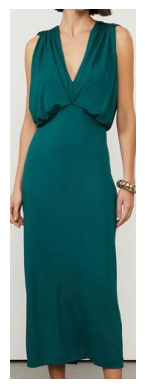


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_VERMELHO.png


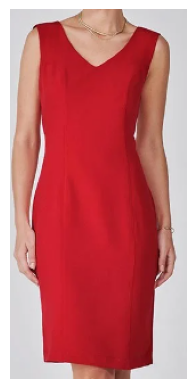

Similaridade: 07-20-6585-0402 - Score: 8.33


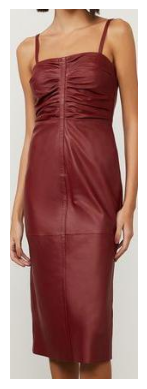

Similaridade: 07-20-6419-8259 - Score: 8.92


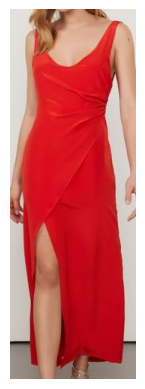

Similaridade: 52-15-1370-8259 - Score: 9.06


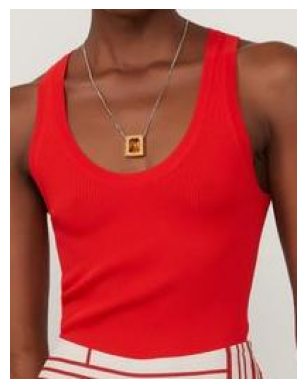


--------------------------------------------------



In [245]:
import torch  # Se estiver usando PyTorch
import pandas as pd
import matplotlib.pyplot as plt
from sentence_transformers import util  # Certifique-se de que está usando a função correta


# # Inverter a ordem dos argumentos
# cos_sim = util.cos_sim(img_embs_teste_lda[colunas_lda].values, img_embs_lda[colunas_lda].values)

# # Verificar as dimensões
# print(f"Dimensões de cos_sim: {cos_sim.shape}")  # Deve ser (num_test, num_dataset)

img_embs_teste_lda = torch.tensor(img_embs_teste_lda[colunas_lda].values, dtype=torch.float32)
img_embs_lda = torch.tensor(img_embs_lda.values, dtype=torch.float32)

euclidean_dist = torch.cdist(img_embs_teste_lda, img_embs_lda, p=2)

# # vestido muito azul
# index_verificacao = df_lda.loc[df_lda['id_produto'] == '07-20-6450-2028'].index[0]

# para cada imagem teste, retornando as 3 imagens mais similares

for i, distances in enumerate(euclidean_dist):
    print(f"Imagem de Teste: {df_teste.iloc[i]['image_path']}")
    plot_image(df_teste.iloc[i]['image_path'])

    # print("Similaridade com vestido azul: ", distances[index_verificacao])
    
    # Garantir que distances esteja no CPU antes de converter para NumPy
    if isinstance(distances, torch.Tensor):
        distances = distances.cpu().numpy()
    
    # Obter os 3 índices com menores distâncias
    top_3_indices = distances.argsort()[:3]
    
    for idx in top_3_indices:
        similar_id = df_lda.iloc[idx]['id_produto']
        similar_score = distances[idx]
        print(f"Similaridade: {similar_id} - Score: {similar_score:.2f}")
        plot_image(df.iloc[idx]['file_path'])
    
    print("\n" + "-"*50 + "\n")
    
# for i, scores in enumerate(cos_sim):
#     print(f"Imagem de Teste: {df_teste.iloc[i]['image_path']}")
#     plot_image(df_teste.iloc[i]['image_path'])

#     print("Similaridade com vestido azul: ", scores[index_verificacao])
    
#     # Garantir que scores esteja no CPU antes de converter para NumPy
#     if isinstance(scores, torch.Tensor):
#         scores = scores.cpu().numpy()
    
#     # Obter os 3 índices com maiores similaridades
#     top_3_indices = scores.argsort()[-3:][::-1]
    
#     for idx in top_3_indices:
#         similar_id = df_lda.iloc[idx]['id_produto']
#         similar_score = scores[idx]
#         print(f"Similaridade: {similar_id} - Score: {similar_score:.2f}")
#         plot_image(df.iloc[idx]['file_path'])
    
#     print("\n" + "-"*50 + "\n")


O modelo não é tão bom em identificar nuances de cor. Por exemplo, ele não consegue diferenciar entre azul claro e azul escuro.

EM SUMA: Ele consegue identificar bem produtos da mesma cor, mas não é bom em retornar os tons mais parecidos.

### Mesmo teste no PCA

In [127]:
pca

PCA(n_components=10)

In [128]:
# Aplicando mesmo PCA usado no treinamento
img_embs_teste_pca = pca.transform(df_teste_embs[colunas_embs].values)

# Adicionando colunas de PCA ao df
for i in range(img_embs_teste_pca.shape[1]):
    df_teste_embs[f'EMB_PCA_{i}'] = img_embs_teste_pca[:, i]

df_teste_embs

,id_produto,emb_img_0,emb_img_1,emb_img_2,emb_img_3,emb_img_4,emb_img_5,emb_img_6,emb_img_7,emb_img_8,...,EMB_PCA_0,EMB_PCA_1,EMB_PCA_2,EMB_PCA_3,EMB_PCA_4,EMB_PCA_5,EMB_PCA_6,EMB_PCA_7,EMB_PCA_8,EMB_PCA_9
0,teste_images_cor/VESTIDO_AZUL.png,0.022595,-0.098656,-0.029099,0.567702,-0.562149,0.065461,-0.195253,-0.300731,0.367395,...,-0.866374,0.928556,1.634849,1.481593,-0.011136,0.645927,1.324273,0.195972,0.649169,0.092829
1,teste_images_cor/VESTIDO_CIANO.png,-0.062952,0.018905,-0.121948,0.007386,-0.161697,0.111981,-0.268656,0.237585,0.651879,...,-0.425869,0.633388,1.364570,1.260493,0.462313,0.622040,1.052281,-0.827082,1.022156,0.622492
2,teste_images_cor/VESTIDO_LISTRADO.png,-0.246816,0.239406,-0.317431,0.397968,-0.143012,0.335053,0.085922,0.136599,0.506718,...,-0.059994,0.511253,1.032264,1.087129,-0.495666,0.760788,0.496580,-0.441340,0.355317,0.721341
3,teste_images_cor/VESTIDO_MARROM.png,0.137735,0.187964,-0.030165,0.146878,-0.452270,0.270015,-0.183899,0.258470,0.667568,...,0.051256,0.997138,1.720223,0.719212,-0.202747,-0.018943,0.455451,-0.139656,0.707566,0.632697
4,teste_images_cor/VESTIDO_MARROM_2.png,-0.291701,-0.018742,-0.069712,0.075746,-0.119037,0.126561,-0.144355,-0.246068,0.475600,...,-0.185400,1.358991,1.424499,0.778113,-0.377428,0.081358,0.607248,-0.329313,0.852359,0.299967
5,teste_images_cor/VESTIDO_ROXO.png,0.124634,-0.303727,-0.022136,0.342569,-0.422898,0.121094,-0.266027,0.140250,0.904812,...,0.033614,0.418873,0.815557,1.529134,-0.158396,0.466375,1.029059,-0.205041,-0.245323,0.145614
6,teste_images_cor/VESTIDO_VERDE.png,0.314174,-0.238452,-0.056733,0.088339,-0.422520,0.088575,0.144455,0.415287,0.372337,...,-0.380315,0.349692,1.529087,1.454683,0.622258,0.139013,-0.057150,-0.507012,0.762464,0.106315
7,teste_images_cor/VESTIDO_VERMELHO.png,0.084025,-0.074181,-0.138748,0.342731,-0.131960,0.477358,-0.196876,0.270788,0.580135,...,-0.499305,0.341251,1.381360,1.013034,-0.348351,0.267228,0.441263,0.387318,0.519087,0.174485


In [129]:
colunas_pca = [col for col in df_teste_embs.columns if 'EMB_PCA' in col]

In [130]:
img_embs_teste_pca = df_teste_embs[colunas_pca].values

In [131]:
img_embs_teste_pca.shape

(8, 10)

In [132]:
img_embeddings_pca.shape

(766, 10)

Imagem de Teste: teste_images_cor/VESTIDO_AZUL.png


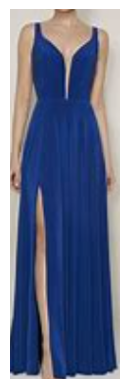

Similaridade: 07-20-6486-09561 - Score: 0.53


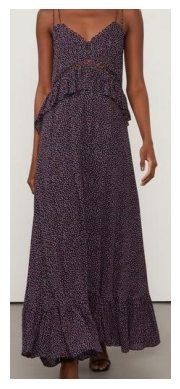

Similaridade: 07-20-6581-04501 - Score: 0.58


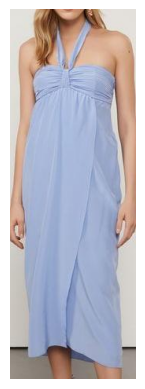

Similaridade: 07-20-6450-2028 - Score: 0.58


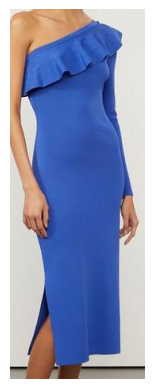


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_CIANO.png


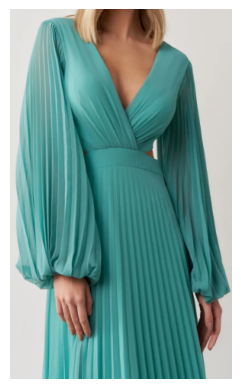

Similaridade: 52-13-5120-0005 - Score: 0.59


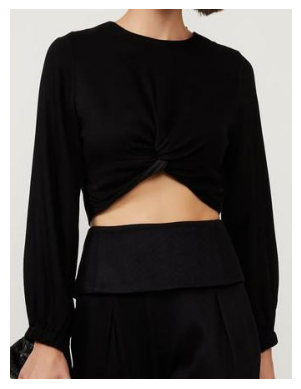

Similaridade: 52-06-0653-0003 - Score: 0.59


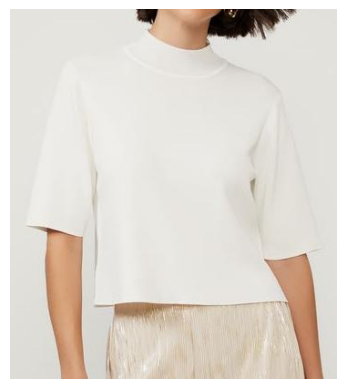

Similaridade: 03-06-0340-09254 - Score: 0.67


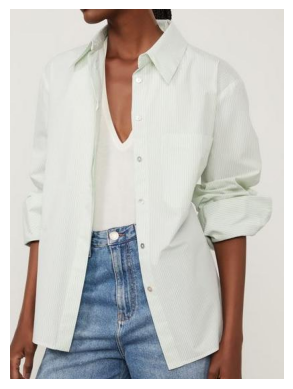


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_LISTRADO.png


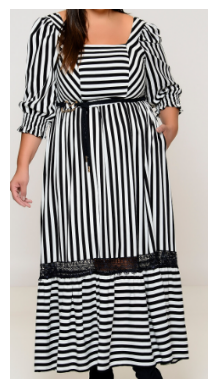

Similaridade: 07-20-6337-0003 - Score: 0.65


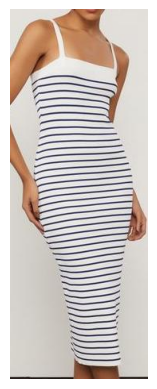

Similaridade: 52-05-1585-0002 - Score: 0.78


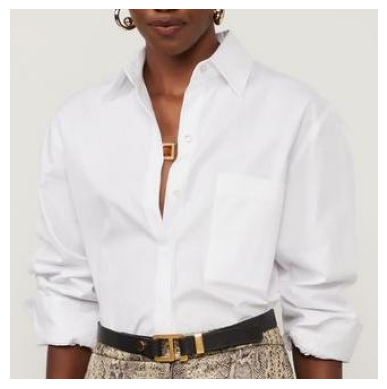

Similaridade: 52-15-1362-0005 - Score: 0.79


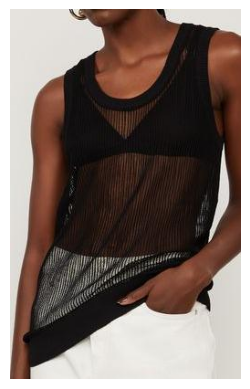


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_MARROM.png


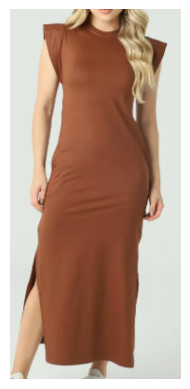

Similaridade: 52-06-0713-0005 - Score: 0.79


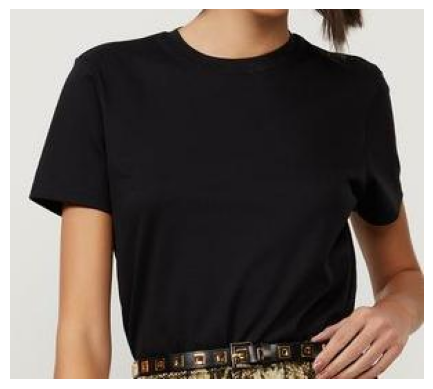

Similaridade: 25-34-1715-1974 - Score: 0.90


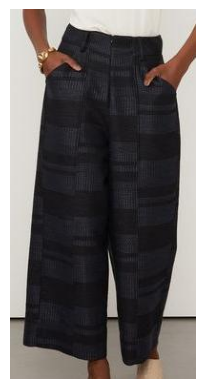

Similaridade: 52-13-5328-0005 - Score: 0.92


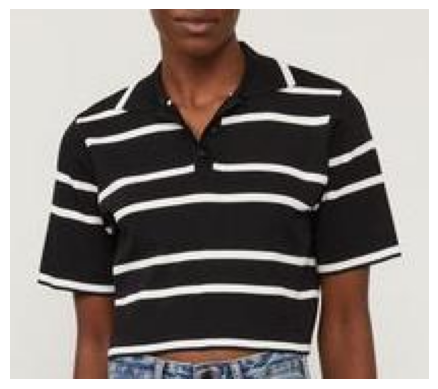


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_MARROM_2.png


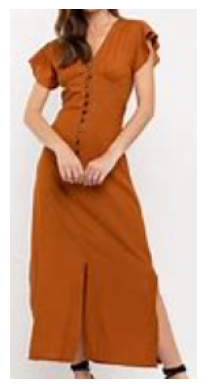

Similaridade: 07-99-0036-09260 - Score: 0.72


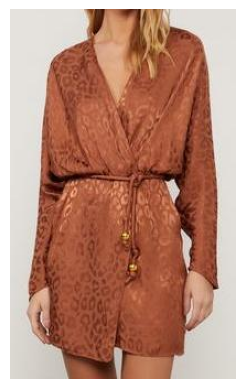

Similaridade: 52-15-1528-0024 - Score: 0.81


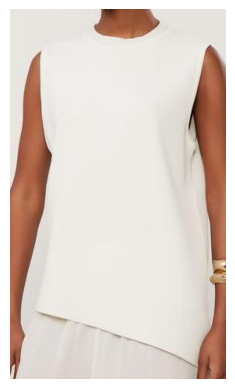

Similaridade: 52-06-0713-0005 - Score: 0.81


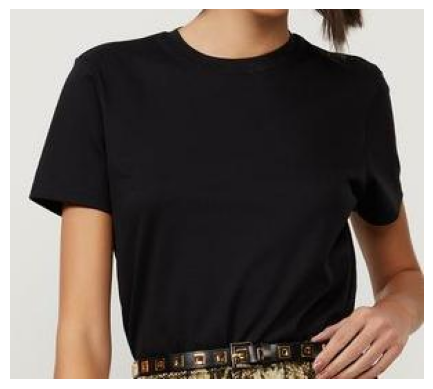


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_ROXO.png


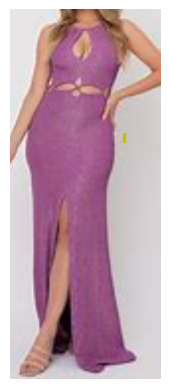

Similaridade: 25-34-2089-04331 - Score: 0.64


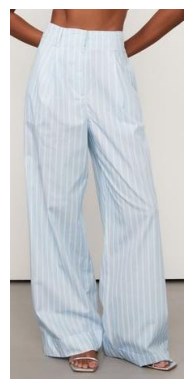

Similaridade: 25-34-1675-1974 - Score: 0.68


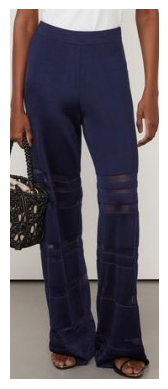

Similaridade: 25-34-1813-0030 - Score: 0.79


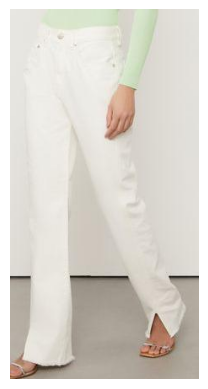


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_VERDE.png


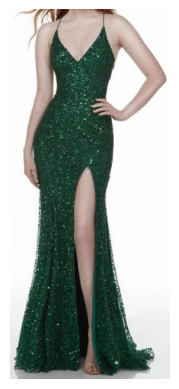

Similaridade: 07-20-6725-09253 - Score: 0.87


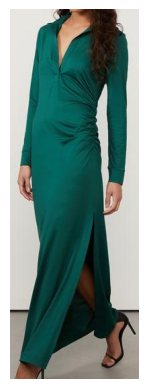

Similaridade: 25-11-1275-09253 - Score: 0.92


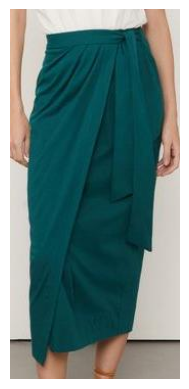

Similaridade: 25-34-1670-09258 - Score: 0.93


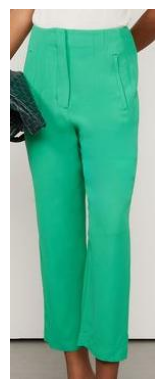


--------------------------------------------------

Imagem de Teste: teste_images_cor/VESTIDO_VERMELHO.png


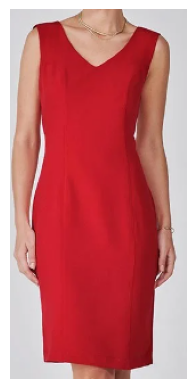

Similaridade: 07-20-6451-8259 - Score: 0.61


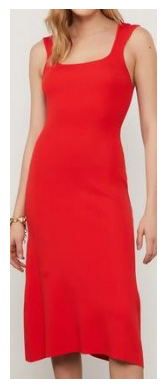

Similaridade: 25-11-1254-8259 - Score: 0.64


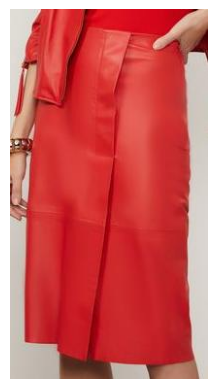

Similaridade: 52-15-1331-8259 - Score: 0.65


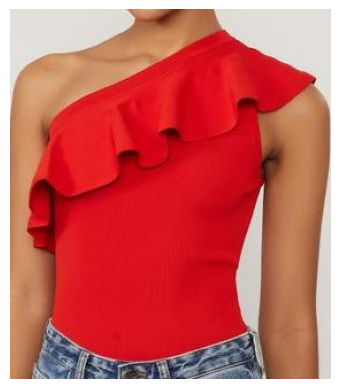


--------------------------------------------------



In [133]:
# # Inverter a ordem dos argumentos
# cos_sim = util.cos_sim(img_embs_teste_pca, img_embeddings_pca)

img_embs_teste_pca = torch.tensor(img_embs_teste_pca, dtype=torch.float32)
img_embeddings_pca = torch.tensor(img_embeddings_pca, dtype=torch.float32)

# # Verificar as dimensões
# print(f"Dimensões de cos_sim: {cos_sim.shape}")  # Deve ser (num_test, num_dataset)

# # index_verificacao = df_lda.loc[df_lda['id_produto'] == '07-20-6450-2028'].index[0]
# index_verificacao = df_lda.loc[df_lda['id_produto'] == '07-20-6333-09253'].index[0]

euclidean_dist = torch.cdist(img_embs_teste_pca, img_embeddings_pca, p=2)

# para cada imagem teste, retornando as 3 imagens mais similares
for i, distances in enumerate(euclidean_dist):
    print(f"Imagem de Teste: {df_teste.iloc[i]['image_path']}")
    plot_image(df_teste.iloc[i]['image_path'])

    # print("Similaridade com vestido azul: ", distances[index_verificacao])
    
    # Garantir que distances esteja no CPU antes de converter para NumPy
    if isinstance(distances, torch.Tensor):
        distances = distances.cpu().numpy()
    
    # Obter os 3 índices com menor distância
    top_3_indices = distances.argsort()[:3]
    
    for idx in top_3_indices:
        similar_id = df.iloc[idx]['id_produto']
        similar_score = distances[idx]
        print(f"Similaridade: {similar_id} - Score: {similar_score:.2f}")
        plot_image(df.iloc[idx]['file_path'])
    
    print("\n" + "-"*50 + "\n")


# # para cada imagem teste, retornando as 3 imagens mais similares
# for i, scores in enumerate(cos_sim):
#     print(f"Imagem de Teste: {df_teste.iloc[i]['image_path']}")
#     plot_image(df_teste.iloc[i]['image_path'])

#     print("Similaridade com vestido verde: ", scores[index_verificacao])
    
#     # Garantir que scores esteja no CPU antes de converter para NumPy
#     if isinstance(scores, torch.Tensor):
#         scores = scores.cpu().numpy()
    
#     # Obter os 3 índices com maiores similaridades
#     top_3_indices = scores.argsort()[-3:][::-1]
    
#     for idx in top_3_indices:
#         similar_id = df.iloc[idx]['id_produto']
#         similar_score = scores[idx]
#         print(f"Similaridade: {similar_id} - Score: {similar_score:.2f}")
#         plot_image(df.iloc[idx]['file_path'])
    
#     print("\n" + "-"*50 + "\n")


O PCA está se confundindo bastante em alguns casos, demonstrando um comportamento inferior ao LDA.